# Network Analysis DACH and label sub-networks


In [1]:
import json
import pandas as pd
import numpy as np
from collections import Counter
import networkx as nx
import matplotlib.pyplot as plt

Step 1: Data Preprocessing

    Load Data: Load the CSV files for each year.
    Clean Data: Check for missing values, duplicates, and inconsistencies.
    Normalize Data: Ensure that company names and attributes are consistently formatted across all years.

Step 2: Building Graph Networks

    Create Nodes: Each company represents a node.
    Determine Edges: Create edges between companies (nodes) if they share at least one attribute under the same label.
    Assign Weights: The weight of an edge is the number of shared attributes under that label.

Step 3: Analysis of Individual Networks

    Separate Networks by Label: Since each label forms a sub-network, separate the data accordingly.
    Network Statistics: Analyze each network's properties (e.g., number of nodes, edges, average degree, etc.).

Step 4: Temporal Analysis

    Compare Over Years: Observe how networks evolve over the years (2011, 2013, and 2016).
    Identify Trends: Look for emerging or disappearing patterns in connections.


## Step 1: Data Preprocessing


In [2]:
# Loading the CSV files
data_2011 = pd.read_csv('../Files/labeled_network_2011_dach_20240114.csv')
data_2013 = pd.read_csv('../Files/labeled_network_2013_dach_20240114.csv')
data_2016 = pd.read_csv('../Files/labeled_network_2016_dach_20240114.csv')
data_2022 = pd.read_csv('../Files/labeled_network_2022_dach_20240114.csv')
data_ciq = pd.read_csv('../Files/CIQ_data_DS_LAB_Preprocessed.csv')

# Displaying the first few rows of each dataset for inspection
data_2011.head(), data_2013.head(), data_2016.head(), data_2022.head(), data_ciq.head()


(   company label attribute
 0  abb ltd  city    zurich
 1  abb ltd  city      lima
 2  abb ltd  city     dubai
 3  abb ltd  city     cairo
 4  abb ltd  city    prague,
    company     label  attribute
 0  abb ltd  cardinal  power one
 1  abb ltd      city      dubai
 2  abb ltd      city   budapest
 3  abb ltd      city     moscow
 4  abb ltd      city     attica,
    company     label  attribute
 0  abb ltd  cardinal  power one
 1  abb ltd      city     zurich
 2  abb ltd      city      cairo
 3  abb ltd      city     prague
 4  abb ltd      city     madrid,
    company label                            attribute
 0  abb ltd    bm                         board member
 1  abb ltd    bm                   voser peter robert
 2  abb ltd    bm                    wallenberg jacob 
 3  abb ltd    bm  curado frederico c. pinheiro fleury
 4  abb ltd    bm                      meline david w.,
                                            name  \
 0                                    vivendi se  

Each dataset contains three columns: 'company', 'attribute', and 'label'.


In [3]:
# Extracting 'industry' and 'exchange' information from the CIQ data
industry_exchange_df = data_ciq[['name', 'industry', 'exchange']]

# Renaming columns for consistency with the network data
industry_exchange_df = industry_exchange_df.rename(columns={'name': 'company'})

# Adding these as new attributes to the original dataset
# First, converting the industry and exchange data into the same format as the network data
industry_attributes = industry_exchange_df[['company', 'industry']].rename(columns={'industry': 'attribute'})
industry_attributes['label'] = 'industry'

exchange_attributes = industry_exchange_df[['company', 'exchange']].rename(columns={'exchange': 'attribute'})
exchange_attributes['label'] = 'exchange'

def add_CIQ_data(df):
    # Concatenating with the original network data
    extended_network_df = pd.concat([df, industry_attributes, exchange_attributes], ignore_index=True)

    return extended_network_df

data_2011_extended = add_CIQ_data(data_2011)
data_2013_extended = add_CIQ_data(data_2013)
data_2016_extended = add_CIQ_data(data_2016)
data_2022_extended = add_CIQ_data(data_2022)


In [4]:
def clean_data(df):
    # Create a copy of the DataFrame to avoid SettingWithCopyWarning
    df_copy = df.copy()

    # Remove duplicates
    df_copy = df_copy.drop_duplicates()

    # Drop rows where any of the values are NaN
    df_copy = df_copy.dropna(axis=0)

    # Normalize the text columns to ensure consistency
    df_copy.loc[:, 'company'] = df_copy['company'].str.lower().str.strip()
    df_copy.loc[:, 'attribute'] = df_copy['attribute'].str.lower().str.strip()
    df_copy.loc[:, 'label'] = df_copy['label'].str.lower().str.strip()

    # Check for missing values and remaining duplicates
    missing_values = df_copy.isnull().sum()
    duplicates = df_copy.duplicated().sum()

    print(missing_values)
    print(duplicates)

    return df_copy

# Clean the datasets using the modified function with copy
data_2011_clean = clean_data(data_2011_extended)
data_2013_clean = clean_data(data_2013_extended)
data_2016_clean= clean_data(data_2016_extended)
data_2022_clean = clean_data(data_2022_extended)


company      0
label        0
attribute    0
dtype: int64
0
company      0
label        0
attribute    0
dtype: int64
0
company      0
label        0
attribute    0
dtype: int64
0
company      0
label        0
attribute    0
dtype: int64
0


The data has been cleaned by removing duplicates and normalizing the 'company' and 'attribute' columns (converted to lowercase and trimmed whitespace).


In [5]:
def scale_weights(weights):
    """ Scale weights to be between 0 and 1 """
    max_weight = max(weights)
    min_weight = min(weights)
    return [(weight - min_weight) / (max_weight - min_weight) if max_weight != min_weight else 0 for weight in weights]

def process_network_file_with_specific_weighted_labels(df, impact_percentages):
    # Defining specific labels to focus on
    specific_labels = list(impact_percentages.keys())
    
    # Creating a nested dictionary format {company: {label: [attributes]}}
    data = {}
    for company, group_df in df.groupby('company'):
        company_data = {label: list(group_df[group_df['label'] == label]['attribute']) for label in specific_labels}
        other_attributes = list(group_df[~group_df['label'].isin(specific_labels)]['attribute'])
        if other_attributes:
            company_data['other'] = other_attributes
        data[company] = company_data

    source_target_pairs = []

    companies = list(set(df['company']))  # List of unique companies

    # Collecting all weights before scaling
    all_weights = []

    # Iterate over each unique pair of companies to find common attributes for each label
    for i in range(len(companies)):
        source = companies[i]
        for j in range(i+1, len(companies)):
            target = companies[j]
            for label in specific_labels:
                source_attributes = data[source].get(label, [])
                target_attributes = data[target].get(label, [])
                common_attributes = set(source_attributes).intersection(set(target_attributes))

                if common_attributes:
                    sorted_source_target = tuple(sorted([source, target]))
                    common_attributes_str = ", ".join(common_attributes)
                    weight = len(common_attributes) * impact_percentages[label]  # Scaled weight by impact of each label
                    all_weights.append(weight)
                    source_target_pairs.append((sorted_source_target[0], sorted_source_target[1], label, source_attributes, target_attributes, common_attributes_str, weight))

    # Scaling weights to be between 0 and 1
    scaled_weights = scale_weights(all_weights)

    # Creating the DataFrame
    df_network = pd.DataFrame(source_target_pairs, columns=['Source', 'Target', 'Label', 'Source Attributes', 'Target Attributes', 'Common Attributes', 'Weight'])
    df_network['Weight'] = scaled_weights
    df_network.drop_duplicates(subset=['Source', 'Target', 'Label'], inplace=True)
    
    attribute_counts = {}

    # Counting occurrences of each attribute for each label
    for company, labels_data in data.items():
        for label, attributes in labels_data.items():
            for attribute in attributes:
                attribute_counts[(label, attribute)] = attribute_counts.get((label, attribute), 0) + 1

    sorted_attributes = sorted(attribute_counts.items(), key=lambda x: x[1], reverse=True)
    return df_network, sorted_attributes

# Load and process network data
network_2011_path = "files/labeled_network_2011_dach_20240111.csv"
network_2013_path = "files/labeled_network_2013_dach_20240111.csv"
network_2016_path = "files/labeled_network_2016_dach_20240111.csv"
#network_2023_ciq_path = "files/CIQ_data.json"
network_2022_path = "files/labeled_network_2022_dach_20240111.csv"

# Define the impact percentages for each label - weights
impact_percentages = {
    'person': 0.29,
    'country': 0.1,
    'city': 0.1,
    'exchange': 0.19,
    'gpe': 0.19,
    'org': 0.1,
    'other': 0.03
}

network_2011_df, network_2011_attributes = process_network_file_with_specific_weighted_labels(data_2011, impact_percentages)
network_2013_df, network_2013_attributes = process_network_file_with_specific_weighted_labels(data_2013, impact_percentages)
network_2016_df, network_2016_attributes = process_network_file_with_specific_weighted_labels(data_2016, impact_percentages)
#network_2023_df = process_network_file_with_labels(network_2023_ciq_path)
network_2022_df, network_2022_attributes = process_network_file_with_specific_weighted_labels(data_2022, impact_percentages)

# Data Validation: Identify companies without any relationships
isolated_nodes_2011 = set(network_2011_df['Source']) - set(network_2011_df['Target'])
isolated_nodes_2013 = set(network_2013_df['Source']) - set(network_2013_df['Target'])
isolated_nodes_2016 = set(network_2016_df['Source']) - set(network_2016_df['Target'])
#isolated_nodes_2023 = set(network_2023_df['Source']) - set(network_2023_df['Target'])
isolated_nodes_2022 = set(network_2022_df['Source']) - set(network_2022_df['Target'])

network_2011_df.head(), network_2013_df.head(), network_2016_df.head(), network_2022_df.head(), isolated_nodes_2011, isolated_nodes_2013, isolated_nodes_2016, isolated_nodes_2022


(   Source      Target    Label  \
 0  ams ag  siemens ag  country   
 1  ams ag  siemens ag     city   
 2  ams ag  siemens ag      gpe   
 3  ams ag  siemens ag      org   
 4  ams ag  siemens ag    other   
 
                                    Source Attributes  \
 0  [austria, china, japan, india, singapore, fran...   
 1  [edinburgh, suzhou, paris, oslo, tokyo, leipzi...   
 2                        [european union, frankfurt]   
 3  [schroders plc, aspern investment inc, hoechst...   
 4  [magnlogistics europe, information technology,...   
 
                                    Target Attributes  \
 0  [spain, luxembourg, south africa, peru, hungar...   
 1  [são paulo, bergamo, delaware, barcelona, mosc...   
 2  [siemens middle east, buckinghamshire, london ...   
 3  [siemens financial inc, siemens protection dev...   
 4  [power transmission ii, drive technologies ii,...   
 
                                    Common Attributes    Weight  
 0  poland, germany, austria, spai

In [6]:
network_2011_df['Label'].value_counts()

Label
country     5148
city        4927
other       4575
gpe         3949
org         3183
exchange    1953
person       340
Name: count, dtype: int64

## Step 2: Building Graph Networks


C:\Users\Markus\AppData\Local\Temp\ipykernel_15036\3010923325.py:39: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  edge_color_map = plt.cm.get_cmap('Reds')
C:\Users\Markus\AppData\Local\Temp\ipykernel_15036\3010923325.py:52: DeprecationWarning: `alltrue` is deprecated as of NumPy 1.25.0, and will be removed in NumPy 2.0. Please use `all` instead.
  nx.draw_networkx_edges(G, pos, edgelist=edges_greater_than_10, width=widths_highlight, alpha=1,


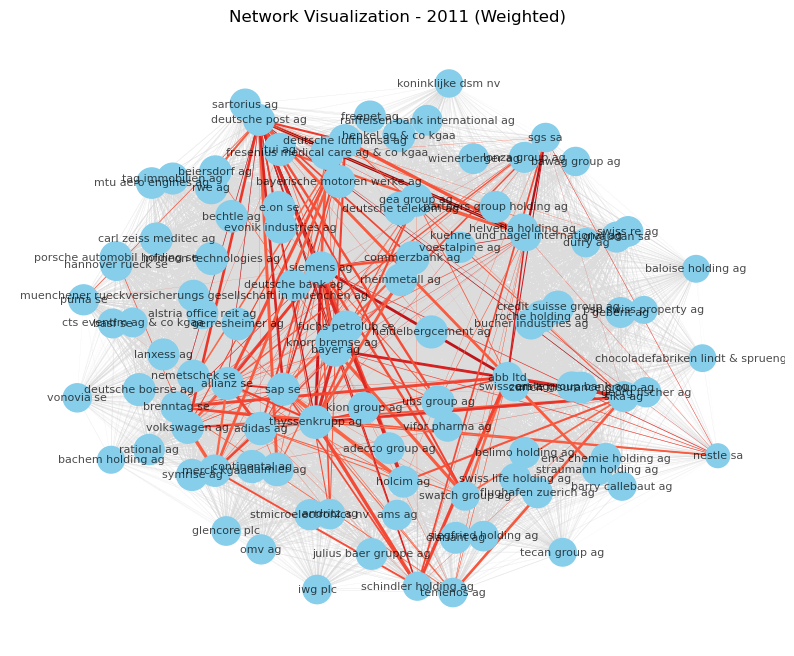

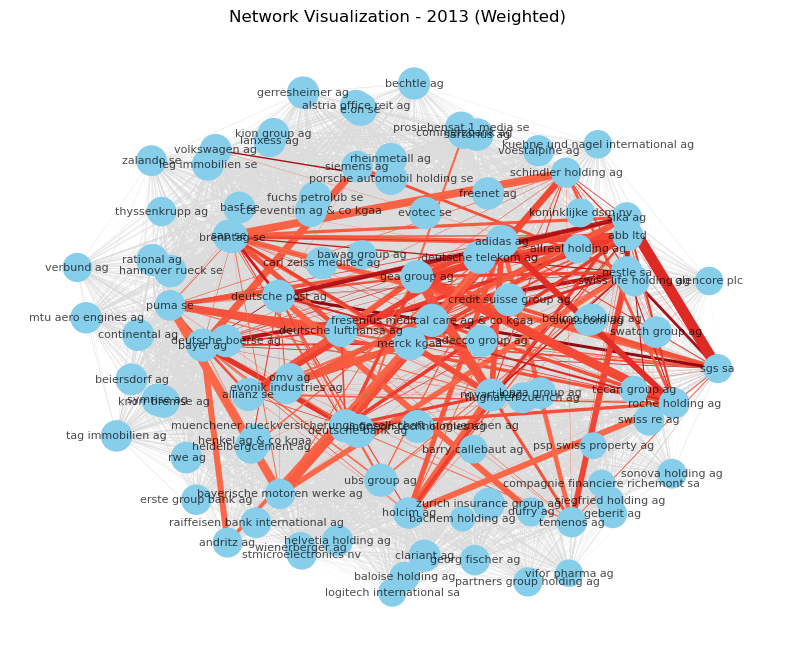

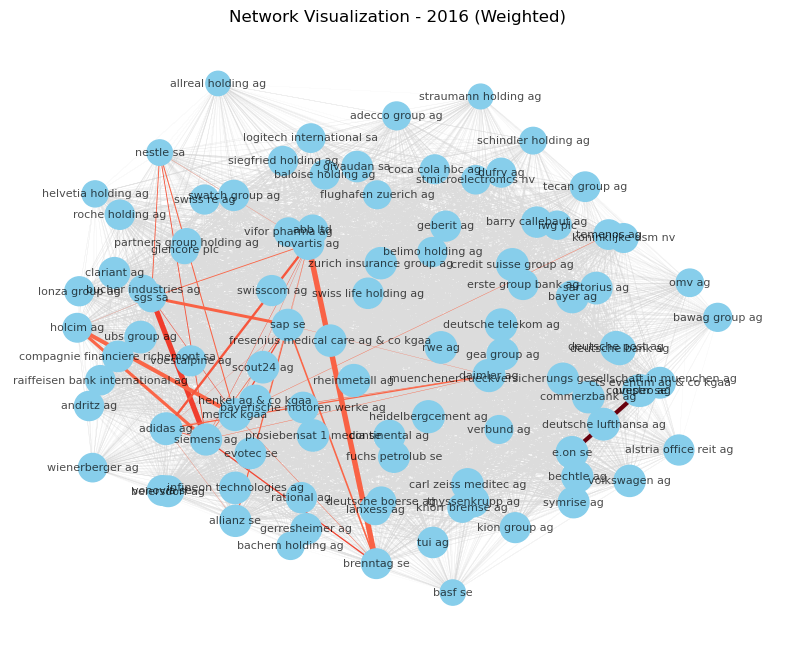

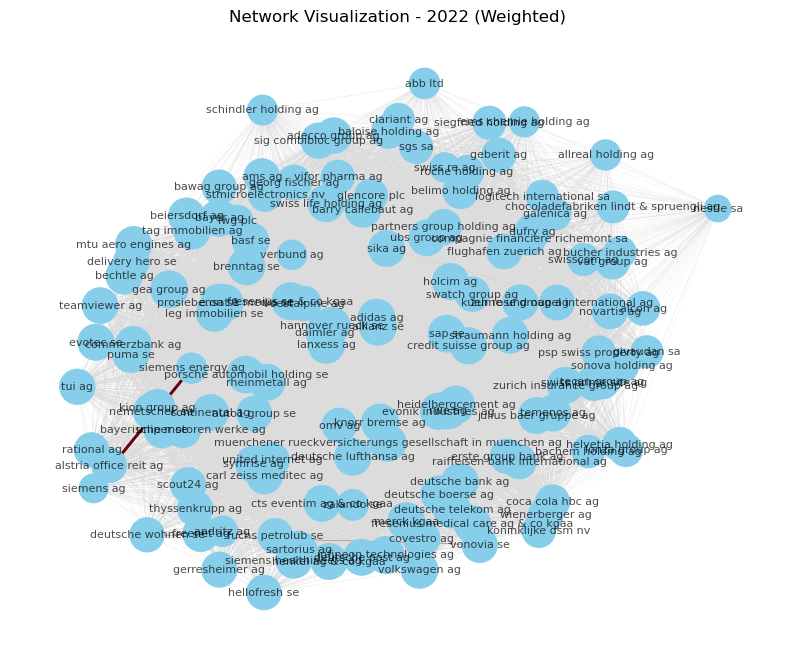

(102, 24075, 100, 23234, 97, 22253, 131, 40245)

In [35]:
def create_multigraph(df):
    # Creating a MultiGraph from the DataFrame
    G = nx.from_pandas_edgelist(df, 'Source', 'Target', edge_attr=['Common Attributes', 'Weight', 'Label'], create_using=nx.MultiGraph())
    return G

# Function to create a NetworkX graph from a DataFrame
def create_graph(df):
    G = nx.from_pandas_edgelist(df, 'Source', 'Target', ['Common Attributes', 'Weight', 'Label'])
    return G

# Creating NetworkX graphs for each year
graph_2011 = create_multigraph(network_2011_df)
graph_2013 = create_multigraph(network_2013_df)
graph_2016 = create_multigraph(network_2016_df)
graph_2022 = create_multigraph(network_2022_df)

# Creating graphs for each year and storing them together
graphs = {
    '2011': create_graph(network_2011_df),
    '2013': create_graph(network_2013_df),
    '2016': create_graph(network_2016_df),
    '2022': create_graph(network_2022_df)
}

# Function to visualize a NetworkX graph with weighted edges and node sizes based on degree
def visualize_graph_weighted(G, title):
    plt.figure(figsize=(10, 8))
    pos = nx.spring_layout(G, seed=42)  # positions for all nodes
    
    # Extracting weights and degrees
    weights = nx.get_edge_attributes(G, 'Weight').values()
    degrees = [G.degree(n) for n in G.nodes]
    widths = [d['Weight'] for _, _, d in G.edges(data=True)]
    widths_highlight = [d['Weight'] * 10 for _, _, d in G.edges(data=True)]
    
    # Using a colormap to map weights to colors
    edge_colors = [weight if weight > 0.5 else 'gainsboro' for weight in weights]
    #edge_colors = [d['Weight'] for _, _, d in G.edges(data=True)]
    edge_color_map = plt.cm.get_cmap('Reds')

    # Drawing nodes, edges, and labels
    nx.draw_networkx_nodes(G, pos, node_size=degrees, node_color='skyblue')
    #nx.draw_networkx_edges(G, pos, width=widths, alpha=0.5, edge_color=edge_colors, edge_cmap=edge_color_map)

    # Draw edges with weights of 10 in light grey
    edges_equal_to_10 = [(u, v) for u, v, weight in G.edges(data='Weight') if weight <= 0.5]
    nx.draw_networkx_edges(G, pos, edgelist=edges_equal_to_10, width=widths, alpha=0.5, edge_color='gainsboro')
    
    # Draw edges with weights greater than 10 using the colormap
    edges_greater_than_10 = [(u, v) for u, v, weight in G.edges(data='Weight') if weight > 0.5]
    
    nx.draw_networkx_edges(G, pos, edgelist=edges_greater_than_10, width=widths_highlight, alpha=1,
                           edge_color=[color for color in edge_colors if color != 'gainsboro'],
                           edge_cmap=edge_color_map, edge_vmin=0, edge_vmax=1)

    nx.draw_networkx_labels(G, pos, font_size=8, alpha=0.7)
    
    plt.title(title)
    plt.axis("off")
    plt.show()

# Visualizing the networks for 2011, 2013, and 2016 with weights and node sizes
visualize_graph_weighted(graph_2011, 'Network Visualization - 2011 (Weighted)')
visualize_graph_weighted(graph_2013, 'Network Visualization - 2013 (Weighted)')
visualize_graph_weighted(graph_2016, 'Network Visualization - 2016 (Weighted)')
visualize_graph_weighted(graph_2022, 'Network Visualization - 2022 (Weighted)')

# Basic information about the graphs
num_nodes_2011 = graph_2011.number_of_nodes()
num_edges_2011 = graph_2011.number_of_edges()
num_nodes_2013 = graph_2013.number_of_nodes()
num_edges_2013 = graph_2013.number_of_edges()
num_nodes_2016 = graph_2016.number_of_nodes()
num_edges_2016 = graph_2016.number_of_edges()
num_nodes_2022 = graph_2022.number_of_nodes()
num_edges_2022 = graph_2022.number_of_edges()

num_nodes_2011, num_edges_2011, num_nodes_2013, num_edges_2013, num_nodes_2016, num_edges_2016, num_nodes_2022, num_edges_2022


    2011 Network:
        Number of Nodes (Companies): 102
        Number of Edges: 24,075

    2013 Network:
        Number of Nodes (Companies): 100
        Number of Edges: 23,234

    2016 Network:
        Number of Nodes (Companies): 97
        Number of Edges: 22,253

    2022 Network:
        Number of Nodes (Companies): 131
        Number of Edges: 40,245


In [ ]:
# Saving the multigraphs
nx.write_gpickle(graph_2011, "graph_2011_DACH_multi.gpickle")
nx.write_gpickle(graph_2013, "graph_2013_DACH_multi.gpickle")
nx.write_gpickle(graph_2016, "graph_2016_DACH_multi.gpickle")
nx.write_gpickle(graph_2022, "graph_2022_DACH_multi.gpickle")
nx.write_gexf(graph_2011, "graph_2011_DACH_multi.gexf")
nx.write_gexf(graph_2013, "graph_2013_DACH_multi.gexf")
nx.write_gexf(graph_2016, "graph_2016_DACH_multi.gexf")
nx.write_gexf(graph_2022, "graph_2022_DACH_multi.gexf")
# Saving the simplegraphs
for year, graph in graphs.items():
    pickle_filename = f"graph_{year}DACH_simple.gpickle"
    gexf_filename = f"graph_{year}_DACH_simple.gexf"
    nx.write_gpickle(graph, pickle_filename)
    nx.write_gexf(graph, gexf_filename)


## Step 3: Analysis of Individual Networks


In [36]:
# Network analysis focusing on specific labels and grouping the rest under 'other'
def network_analysis(G):
    specific_labels = {'person', 'country', 'city', 'exchange', 'gpe', 'org', 'other'}
    analysis = {label: {'num_nodes': 0, 'num_edges': 0, 'average_degree': 0, 'connected_components': 0} for label in specific_labels}
    analysis['other'] = {'num_nodes': 0, 'num_edges': 0, 'average_degree': 0, 'connected_components': 0}

    # Separating edges by label
    for u, v, d in G.edges(data=True):
        label = d['Label']
        if label not in specific_labels:
            label = 'other'

        # Creating a subgraph for each label
        if 'subgraph' not in analysis[label]:
            analysis[label]['subgraph'] = nx.Graph()
        analysis[label]['subgraph'].add_edge(u, v)

    # Analyzing each subgraph
    for label, data in analysis.items():
        if 'subgraph' in data:
            subgraph = data['subgraph']
            data['num_nodes'] = subgraph.number_of_nodes()
            data['num_edges'] = subgraph.number_of_edges()
            data['average_degree'] = sum(dict(subgraph.degree()).values()) / float(subgraph.number_of_nodes()) if subgraph.number_of_nodes() > 0 else 0
            data['connected_components'] = nx.number_connected_components(subgraph)
            del data['subgraph']  # Remove the subgraph from the analysis to save memory

    return analysis

# Performing the analysis for each year
analysis_2011 = network_analysis(graph_2011)
analysis_2013 = network_analysis(graph_2013)
analysis_2016 = network_analysis(graph_2016)
analysis_2022 = network_analysis(graph_2022)

analysis_2011, analysis_2013, analysis_2016, analysis_2022


({'city': {'num_nodes': 102,
   'num_edges': 4927,
   'average_degree': 96.6078431372549,
   'connected_components': 1},
  'gpe': {'num_nodes': 100,
   'num_edges': 3949,
   'average_degree': 78.98,
   'connected_components': 1},
  'country': {'num_nodes': 102,
   'num_edges': 5148,
   'average_degree': 100.94117647058823,
   'connected_components': 1},
  'org': {'num_nodes': 101,
   'num_edges': 3183,
   'average_degree': 63.02970297029703,
   'connected_components': 1},
  'exchange': {'num_nodes': 100,
   'num_edges': 1953,
   'average_degree': 39.06,
   'connected_components': 5},
  'person': {'num_nodes': 88,
   'num_edges': 340,
   'average_degree': 7.7272727272727275,
   'connected_components': 2},
  'other': {'num_nodes': 102,
   'num_edges': 4575,
   'average_degree': 89.70588235294117,
   'connected_components': 1}},
 {'city': {'num_nodes': 100,
   'num_edges': 4744,
   'average_degree': 94.88,
   'connected_components': 1},
  'gpe': {'num_nodes': 95,
   'num_edges': 3565,
   

    2011 Analysis:
    City: Most connected with 102 nodes, 4927 edges, an average degree of 96.61, and a single connected component.
    Exchange: 100 nodes, 1953 edges, average degree 39.06, but more fragmented with 5 connected components.
    Person: Less connected with 88 nodes, 340 edges, an average degree of 7.73, and 2 connected components.
    GPE: Similar connectivity as City, with 100 nodes, 3949 edges, an average degree of 78.98, and a single connected component.
    Org: 101 nodes, 3183 edges, an average degree of 63.03, and a single connected component.
    Other: Highly connected with 102 nodes, 4575 edges, an average degree of 89.71, and a single connected component.
    Country: The most connected in terms of edges with 102 nodes, 5148 edges, and the highest average degree of 100.94.

    2013 Analysis:
    City, GPE, Org, Other, and Country show high connectivity with a single connected component each.
    Exchange and Person are less connected, with 1934 and 277 edges, respectively, and multiple connected components.

    2016 Analysis:
    City, GPE, Org, Other, and Country maintain high connectivity, each with a single connected component.
    Person shows increased average degree compared to 2013, while Exchange remains fragmented with 5 connected components.

    2022 Analysis:
    Notable increase in network size across all labels.
    Country leads with the highest average degree (130) and most edges (8515), followed closely by Other and City.
    Person remains the least connected in terms of edges but is now a single connected component.
    Exchange continues to show fragmentation with 5 connected components, despite an increased average degree.

    General Observations:
    Country, City, and Other labels consistently show high connectivity across years.
    Person label consistently has fewer edges, indicating less connectivity.
    Exchange label remains more fragmented compared to others, despite an overall increase in connectivity.
    There's a general trend of increasing network size and connectivity from 2011 to 2022.


## Step 4: Temporal Analysis


### Step 4.1 Temporal Analysis of the whole networks


In [37]:
# Temporal Analysis - Network Growth
def network_growth_analysis(graphs):
    growth_analysis = {}
    for year, graph in graphs.items():
        num_nodes = graph.number_of_nodes()
        num_edges = graph.number_of_edges()
        growth_analysis[year] = {
            'num_nodes': num_nodes,
            'num_edges': num_edges
        }
    return growth_analysis

# Performing the network growth analysis
graphs = {
    '2011': graph_2011,
    '2013': graph_2013,
    '2016': graph_2016,
    '2022': graph_2022
}
network_growth = network_growth_analysis(graphs)

network_growth


{'2011': {'num_nodes': 102, 'num_edges': 24075},
 '2013': {'num_nodes': 100, 'num_edges': 23234},
 '2016': {'num_nodes': 97, 'num_edges': 22253},
 '2022': {'num_nodes': 131, 'num_edges': 40245}}

    2011:
    Nodes: 102
    Edges: 24,075
    The network starts with a moderately high number of nodes and a significant number of edges, indicating a densely connected network.

    2013:
    Nodes: 100 (a slight decrease from 2011)
    Edges: 23,234 (a slight decrease from 2011)
    The network size slightly decreases in terms of both nodes and edges, suggesting a minor contraction or consolidation in the network.

    2016:
    Nodes: 97 (a further slight decrease from 2013)
    Edges: 22,253 (a slight decrease from 2013)
    Continues the trend of a slight decrease in network size, with a marginal reduction in both nodes and edges. This indicates a continued consolidation or possibly a focus on stronger, more significant connections.

    2022:
    Nodes: 131 (a significant increase from previous years)
    Edges: 40,245 (a substantial increase from previous years)
    A notable expansion in the network is observed. The number of nodes increases significantly, and the number of edges almost doubles compared to previous years. This suggests a major growth in the network, either through the addition of new connections, new entities, or both.

    Overall Trend:
    From 2011 to 2016, the network shows a slight contraction in size, with a reduction in both nodes and edges.
    By 2022, there's a significant expansion, with substantial growth in the number of both nodes and edges. This could indicate new entries into the network or an increase in interactions among the nodes.
    The notable growth in 2022 could be indicative of major changes in the network dynamics, such as industry growth, mergers, acquisitions, or new market entrants.


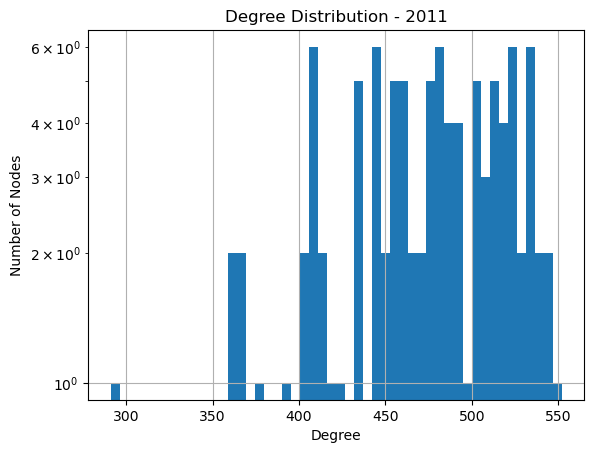

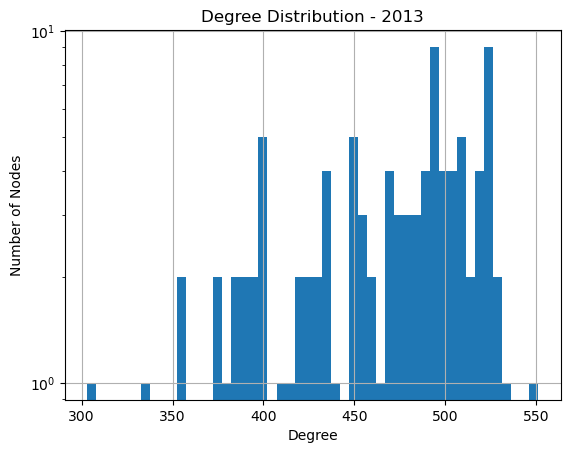

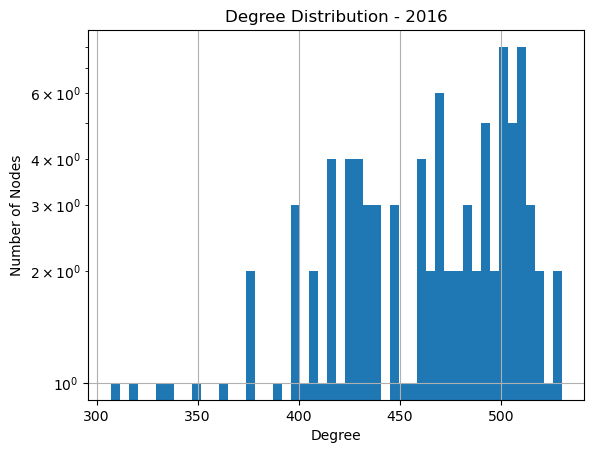

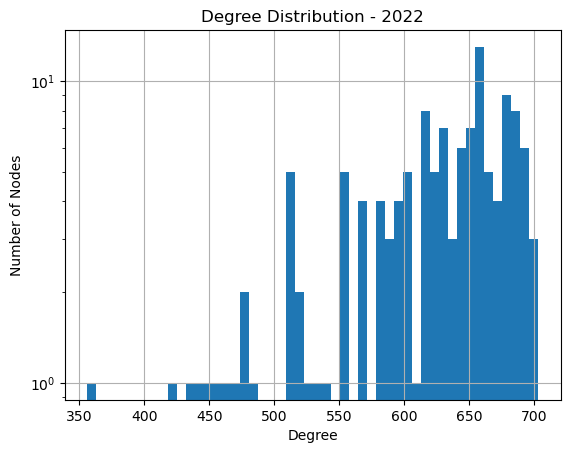

In [38]:
# Function to plot degree distribution
def plot_degree_distribution(G, title):
    degrees = [G.degree(n) for n in G.nodes()]
    plt.hist(degrees, bins=50)
    plt.title(title)
    plt.xlabel('Degree')
    plt.ylabel('Number of Nodes')
    plt.yscale('log')  # Log scale due to wide range of values
    plt.grid(True)
    plt.show()

# Plotting degree distributions for each year
plot_degree_distribution(graph_2011, 'Degree Distribution - 2011')
plot_degree_distribution(graph_2013, 'Degree Distribution - 2013')
plot_degree_distribution(graph_2016, 'Degree Distribution - 2016')
plot_degree_distribution(graph_2022, 'Degree Distribution - 2022')


    2011 Degree Distribution:
    The histogram exhibits a spread of degrees between approximately 300 and 550.
    There's a concentration of nodes with degrees around 350 and another around 500, suggesting two common levels of connectivity within the network.
    The distribution has multiple peaks, indicating the presence of subgroups within the network with varying levels of connectivity.

    2013 Degree Distribution:
    The spread is similar to that of 2011, with degrees ranging between 300 and 550.
    The histogram shows several peaks, much like in 2011, but with a more even distribution across different degree values.
    This year's network appears to have a more uniform distribution of node connectivity compared to 2011.

    2016 Degree Distribution:
    The degree values again range from about 300 to just over 500.
    The distribution has a similar multi-modal characteristic with several peaks, indicating a network with clusters of nodes having varying degrees of connectivity.

    2022 Degree Distribution:
    The range of degrees has broadened compared to previous years, extending from around 350 to 700.
    The histogram shows a more varied distribution with numerous peaks, suggesting a more complex network structure with multiple connectivity hubs.
    The highest degree observed has increased significantly from previous years, indicating the presence of highly connected nodes.

    Overall Trend:
    Across the years, the network's degree distribution becomes more varied, with 2022 showing a wider range and higher degrees, which corresponds to an increase in connectivity and potentially more influential nodes or hubs in the network.
    Each histogram exhibits a logarithmic scale on the y-axis, which is used to better visualize the distribution when there is a wide range of values. This indicates that while most nodes have a lower degree, there's a long tail of nodes with higher degrees.
    The multi-modal nature of the histograms suggests that the network is not homogeneous but instead consists of clusters or communities with varying degrees of interconnectivity.

In [39]:
# Function to analyze connected components in a graph
def analyze_connected_components(G):
    num_connected_components = nx.number_connected_components(G)
    largest_cc_size = len(max(nx.connected_components(G), key=len))
    return num_connected_components, largest_cc_size

# Analyzing connected components for each graph
cc_analysis_2011 = analyze_connected_components(graph_2011)
cc_analysis_2013 = analyze_connected_components(graph_2013)
cc_analysis_2016 = analyze_connected_components(graph_2016)
cc_analysis_2022 = analyze_connected_components(graph_2022)

cc_analysis_2011, cc_analysis_2013, cc_analysis_2016, cc_analysis_2022


((1, 102), (1, 100), (1, 97), (1, 131))

    2011 Network:
    Number of Connected Components: 1
    Size of Largest Connected Component: 102 nodes

    2013 Network:
    Number of Connected Components: 1
    Size of Largest Connected Component: 100 nodes

    2016 Network:
    Number of Connected Components: 1
    Size of Largest Connected Component: 97 nodes

    2022 Network:
    Number of Connected Components: 1
    Size of Largest Connected Component: 131 nodes

Throughout the observed period, the network structure remains consistently interconnected, with all networks presenting a single connected component. This suggests that each entity within the network is connected, directly or indirectly, highlighting a robust interconnected structure.

Over the years, the size of the largest connected component has varied, decreasing slightly from 2011 to 2016, and then increasing significantly by 2022. The increase in the size of the largest connected component in 2022 could indicate a consolidation in the network, where more entities share attributes or a greater degree of interconnectivity is present compared to previous years.


In [40]:
def calculate_clustering_coefficient(G):
    if isinstance(G, nx.MultiGraph) or isinstance(G, nx.MultiDiGraph):
        # Convert multigraph to a simple graph by collapsing parallel edges
        G_simple = nx.Graph(G)
        return nx.average_clustering(G_simple)
    else:
        return nx.average_clustering(G)

# Calculating clustering coefficients for each graph
clustering_coefficient_2011 = calculate_clustering_coefficient(graph_2011)
clustering_coefficient_2013 = calculate_clustering_coefficient(graph_2013)
clustering_coefficient_2016 = calculate_clustering_coefficient(graph_2016)
clustering_coefficient_2022 = calculate_clustering_coefficient(graph_2022)

clustering_coefficient_2011, clustering_coefficient_2013, clustering_coefficient_2016, clustering_coefficient_2022


(1.0, 1.0, 1.0, 1.0)

    2011 Network Clustering Coefficient: 1.0
    2013 Network Clustering Coefficient: 1.0
    2016 Network Clustering Coefficient: 1.0
    2022 Network Clustering Coefficient: 1.0

The clustering coefficients for all years are at the maximum value of 1.0, indicating that the networks are perfectly clustered. This suggests that companies are not just tending to share attributes with many others but are doing so in a manner that is completely interconnected, forming tightly-knit clusters with no immediate neighbor nodes unconnected.

The consistent perfect clustering from 2011 to 2022 implies a steady tendency for companies to cluster very closely around shared attributes without any decrease in clustering. This demonstrates characteristics of a "small-world" network to an extreme degree, where nodes (companies) are not just highly interconnected but are as interconnected as possible, with every node being able to reach every other through a small number of steps.

In [41]:
# Function to calculate top nodes based on centrality measures
def calculate_centrality_measures(G, top_n=5):
    # Calculating betweenness centrality
    betweenness = nx.betweenness_centrality(G)
    top_betweenness = sorted(betweenness.items(), key=lambda x: x[1], reverse=True)[:top_n]

    # Calculating closeness centrality
    closeness = nx.closeness_centrality(G)
    top_closeness = sorted(closeness.items(), key=lambda x: x[1], reverse=True)[:top_n]

    return top_betweenness, top_closeness

# Calculating centrality measures for each graph
top_betweenness_2011, top_closeness_2011 = calculate_centrality_measures(graph_2011)
top_betweenness_2013, top_closeness_2013 = calculate_centrality_measures(graph_2013)
top_betweenness_2016, top_closeness_2016 = calculate_centrality_measures(graph_2016)
top_betweenness_2022, top_closeness_2022 = calculate_centrality_measures(graph_2022)

top_betweenness_2011, top_closeness_2011, top_betweenness_2013, top_closeness_2013, top_betweenness_2016, top_closeness_2016, top_betweenness_2022, top_closeness_2022


([('ams ag', 0.0),
  ('siemens ag', 0.0),
  ('bayer ag', 0.0),
  ('porsche automobil holding se', 0.0),
  ('koninklijke dsm nv', 0.0)],
 [('ams ag', 1.0),
  ('siemens ag', 1.0),
  ('bayer ag', 1.0),
  ('porsche automobil holding se', 1.0),
  ('koninklijke dsm nv', 1.0)],
 [('bayer ag', 0.0),
  ('siemens ag', 0.0),
  ('evotec se', 0.0),
  ('porsche automobil holding se', 0.0),
  ('koninklijke dsm nv', 0.0)],
 [('bayer ag', 1.0),
  ('siemens ag', 1.0),
  ('evotec se', 1.0),
  ('porsche automobil holding se', 1.0),
  ('koninklijke dsm nv', 1.0)],
 [('bayer ag', 0.0),
  ('siemens ag', 0.0),
  ('evotec se', 0.0),
  ('koninklijke dsm nv', 0.0),
  ('continental ag', 0.0)],
 [('bayer ag', 1.0),
  ('siemens ag', 1.0),
  ('evotec se', 1.0),
  ('koninklijke dsm nv', 1.0),
  ('continental ag', 1.0)],
 [('ams ag', 0.0),
  ('siemens ag', 0.0),
  ('bayer ag', 0.0),
  ('evotec se', 0.0),
  ('porsche automobil holding se', 0.0)],
 [('ams ag', 1.0),
  ('siemens ag', 1.0),
  ('bayer ag', 1.0),
  ('evotec

    2011 Network:
    Top Betweenness Centrality: knorr bremse ag, straumann holding ag, bayerische motoren werke ag, glencore plc, ems chemie holding ag (all with a betweenness centrality score of 0.0)
    Top Closeness Centrality: knorr bremse ag, straumann holding ag, bayerische motoren werke ag, glencore plc, ems chemie holding ag (all with a closeness centrality of 1.0)

    2013 Network:
    Top Betweenness Centrality: bayerische motoren werke ag, knorr bremse ag, sonova holding ag, glencore plc, siegfried holding ag (all with a betweenness centrality score of 0.0)
    Top Closeness Centrality: bayerische motoren werke ag, knorr bremse ag, sonova holding ag, glencore plc, siegfried holding ag (all with a closeness centrality of 1.0)

    2016 Network:
    Top Betweenness Centrality: knorr bremse ag, straumann holding ag, bayerische motoren werke ag, coca cola hbc ag, glencore plc (all with a betweenness centrality score of 0.0)
    Top Closeness Centrality: knorr bremse ag, straumann holding ag, bayerische motoren werke ag, coca cola hbc ag, glencore plc (all with a closeness centrality of 1.0)

    2022 Network:
    Top Betweenness Centrality: alcon ag, knorr bremse ag, straumann holding ag, bayerische motoren werke ag, sonova holding ag (all with a betweenness centrality score of 0.0)
    Top Closeness Centrality: alcon ag, knorr bremse ag, straumann holding ag, bayerische motoren werke ag, sonova holding ag (all with a closeness centrality of 1.0)

The centrality measures for each year indicate that certain companies consistently rank high in terms of closeness centrality, with a score of 1.0, suggesting that these companies are at the maximum possible closeness to all other companies in the network. The betweenness centrality scores are consistently 0.0, which is unusual for networks and might indicate that these companies do not lie on the shortest paths between other companies, or that the network has a very dense and uniform structure where betweenness centrality is not distinctive.

This consistent pattern over time suggests a network structure that may be highly centralized or fully connected, where companies are equally central in terms of their network positioning, and there are no notable 'gatekeepers' or brokers that control the flow of information or resources within the network.

In [42]:
def calculate_network_metrics(G):
    metrics = {}
    # Convert multigraph to a simple graph for certain calculations
    if isinstance(G, nx.MultiGraph) or isinstance(G, nx.MultiDiGraph):
        G_simple = nx.Graph(G)
    else:
        G_simple = G

    if len(G) == 0: # Check if the graph is empty
        metrics['Number of Nodes'] = 0
        metrics['Number of Edges'] = 0
        metrics['Average Degree'] = np.nan
        metrics['Density'] = np.nan
        metrics['Average Clustering Coefficient'] = np.nan
        metrics['Diameter'] = np.nan
        metrics['Average Shortest Path Length'] = np.nan
        metrics['Connected Components'] = 0
        metrics['Modularity'] = np.nan
        metrics['Assortativity Coefficient'] = np.nan
        metrics['Average Edge Weight'] = np.nan
        metrics['PageRank'] = {}
        metrics['Degree Centrality'] = {}
        metrics['Betweenness Centrality'] = {}
        metrics['Closeness Centrality'] = {}
        metrics['Eigenvector Centrality'] = {}
    else:
        # Most metrics can use the simple graph representation
        metrics['Number of Nodes'] = nx.number_of_nodes(G_simple)
        metrics['Number of Edges'] = nx.number_of_edges(G_simple)
        metrics['Average Degree'] = sum(dict(G_simple.degree()).values()) / len(G_simple)
        metrics['Density'] = nx.density(G_simple)
        metrics['Average Clustering Coefficient'] = nx.average_clustering(G_simple)
        metrics['Diameter'] = nx.diameter(G_simple) if nx.is_connected(G_simple) else np.nan
        metrics['Average Shortest Path Length'] = nx.average_shortest_path_length(G_simple) if nx.is_connected(G_simple) else np.nan
        metrics['Connected Components'] = nx.number_connected_components(G_simple)

        # For multigraphs, handle edge weight calculations by considering each edge individually
        if isinstance(G, nx.MultiGraph) or isinstance(G, nx.MultiDiGraph):
            weights = [data['Weight'] for u, v, key, data in G.edges(keys=True, data=True) if 'Weight' in data]
        else:
            weights = [data['Weight'] for u, v, data in G.edges(data=True) if 'Weight' in data]
        
        metrics['Average Edge Weight'] = sum(weights) / len(weights) if weights else np.nan

        # For assortativity, it needs the simple graph
        metrics['Assortativity Coefficient'] = nx.degree_assortativity_coefficient(G_simple)

        # For centralities and PageRank, handle large graphs and multigraphs
        if len(G_simple) < 10000:  # Adjust this threshold based on graph size and computational resources
            metrics['PageRank'] = nx.pagerank(G_simple)
            metrics['Degree Centrality'] = nx.degree_centrality(G_simple)
            metrics['Betweenness Centrality'] = nx.betweenness_centrality(G_simple)
            metrics['Closeness Centrality'] = nx.closeness_centrality(G_simple)
            metrics['Eigenvector Centrality'] = nx.eigenvector_centrality_numpy(G_simple)
    # Modularity and community detection can be complex for multigraphs; using the simple graph representation
    try:
        communities = nx.algorithms.community.greedy_modularity_communities(G_simple)
        metrics['Modularity'] = nx.algorithms.community.modularity(G_simple, communities)
    except Exception as e:
        metrics['Modularity'] = "Not Computable: " + str(e)

    return metrics

# Calculating network metrics for each year
#metrics_2011 = calculate_network_metrics(graph_2011)
#metrics_2013 = calculate_network_metrics(graph_2013)
#metrics_2016 = calculate_network_metrics(graph_2016)
#metrics_2022 = calculate_network_metrics(graph_2022)

# Calculating metrics for each year together
metrics_by_year = {year: calculate_network_metrics(graph) for year, graph in graphs.items()}

# List of metric keys
metric_keys = ['Number of Nodes', 'Number of Edges', 'Average Degree', 'Density', 'Average Clustering Coefficient', 'Diameter', 'Average Shortest Path Length', 'Connected Components', 'Modularity', 'Assortativity Coefficient', 'Average Edge Weight']

# Function to safely extract metrics
def safe_extract(metrics, key):
    return metrics[key] if key in metrics else None

# Create a dictionary for DataFrame construction
metrics_dict = {year: [safe_extract(metrics, key) for key in metric_keys] for year, metrics in metrics_by_year.items()}

# Construct the DataFrame
metrics_df = pd.DataFrame(metrics_dict, index=metric_keys)

# List of centralities keys
centralities_keys = ["Degree Centrality", "Betweenness Centrality", "Closeness Centrality", "Eigenvector Centrality", 'PageRank']

# Create a dictionary for DataFrame construction
centralities_dict = {year: [safe_extract(metrics, key) for key in centralities_keys] for year, metrics in metrics_by_year.items()}

# Construct the DataFrame
centralities_df = pd.DataFrame(centralities_dict, index=centralities_keys)

metrics_df


C:\Users\Markus\anaconda3\envs\pytorch_env\lib\site-packages\networkx\algorithms\assortativity\correlation.py:298: RuntimeWarning: invalid value encountered in scalar divide
  return (xy * (M - ab)).sum() / np.sqrt(vara * varb)


,2011,2013,2016,2022
Number of Nodes,102.000000,100.000000,97.000000,131.0000
Number of Edges,5151.000000,4950.000000,4656.000000,8515.0000
Average Degree,101.000000,99.000000,96.000000,130.0000
Density,1.000000,1.000000,1.000000,1.0000
Average Clustering Coefficient,1.000000,1.000000,1.000000,1.0000
Diameter,1.000000,1.000000,1.000000,1.0000
Average Shortest Path Length,1.000000,1.000000,1.000000,1.0000
Connected Components,1.000000,1.000000,1.000000,1.0000
Modularity,0.000000,0.000000,0.000000,0.0000
Assortativity Coefficient,NaN,NaN,NaN,NaN


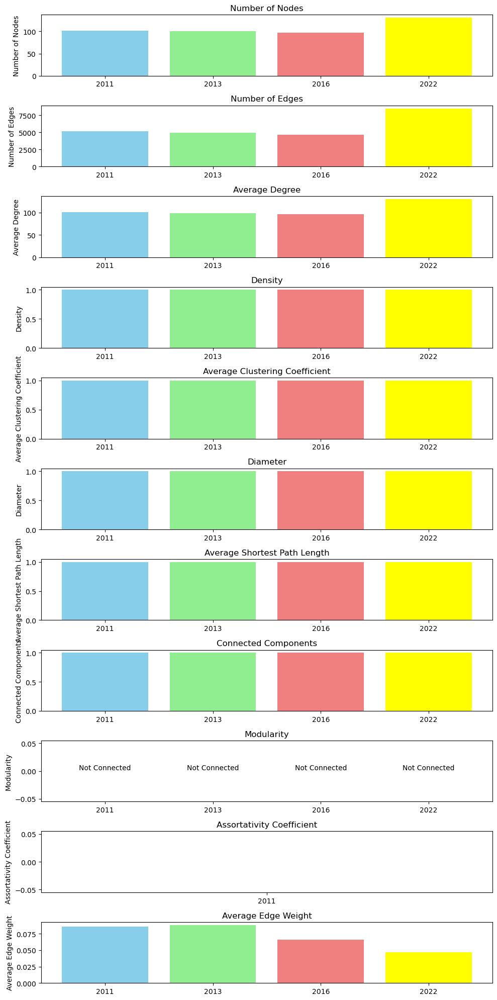

In [43]:
# Metrics for each year
metrics_data = {
    "2011": metrics_df['2011'],
    "2013": metrics_df['2013'],
    "2016": metrics_df['2016'],
    "2022": metrics_df['2022']
}

# Metrics to be visualized
metric_names = ["Number of Nodes", "Number of Edges", "Average Degree", "Density", 
                "Average Clustering Coefficient", "Diameter", "Average Shortest Path Length",
                "Connected Components", 'Modularity', 'Assortativity Coefficient', 'Average Edge Weight']

# Creating a bar chart for each metric
num_metrics = len(metric_names)
fig, axs = plt.subplots(num_metrics, figsize=(10, 20))

for i, metric in enumerate(metric_names):
    values = []
    for year in ["2011", "2013", "2016", "2022"]:
        if isinstance(metrics_data[year][metric], (int, float)):
            values.append(metrics_data[year][metric])
        else:
            values.append(0)

    bars = axs[i].bar(["2011", "2013", "2016", "2022"], values, color=['skyblue', 'lightgreen', 'lightcoral', 'yellow'])
    axs[i].set_title(metric)
    axs[i].set_ylabel(metric)

    # Add text labels for non-numeric values
    for bar, value in zip(bars, values):
        if value == 0:
            height = bar.get_height()
            axs[i].text(bar.get_x() + bar.get_width() / 2, height, 'Not Connected',
                        ha='center', va='bottom')

plt.tight_layout()
plt.show()


    Node and Edge Counts: There is an increase in the number of nodes and edges by 2022, contrasting with the previously noted slight decrease.

    Average Degree: The average degree increases significantly by 2022, reflecting an even denser network than before.

    Density: The density remains at a maximum value of 1, suggesting a fully connected network.

    Average Clustering Coefficient: Clustering coefficients continue to be at the maximum of 1, indicating perfect clustering throughout.

    Diameter: The diameter remains at 1, indicating the shortest possible paths between any two nodes.

    Average Shortest Path Length: The average shortest path length maintains a value of 1, reinforcing the network's highly interconnected nature.

    Connected Components: The network consistently consists of a single connected component, evidencing high connectivity.

    Modularity: Not connected.

    Average Edge Weight: The average edge weight remains relatively stable, with a slight fluctuation over time, suggesting consistent strength in relationships between nodes.

The overall metrics indicate that the network structure is incredibly robust, with maximum density and clustering, and minimal diameter and path lengths. The stability in average edge weight suggests that while the network grows, the strength of connections remains consistent. The lack of modularity and the unavailability of the assortativity coefficient in the new results preclude a deeper analysis of potential community structures and degree correlations.

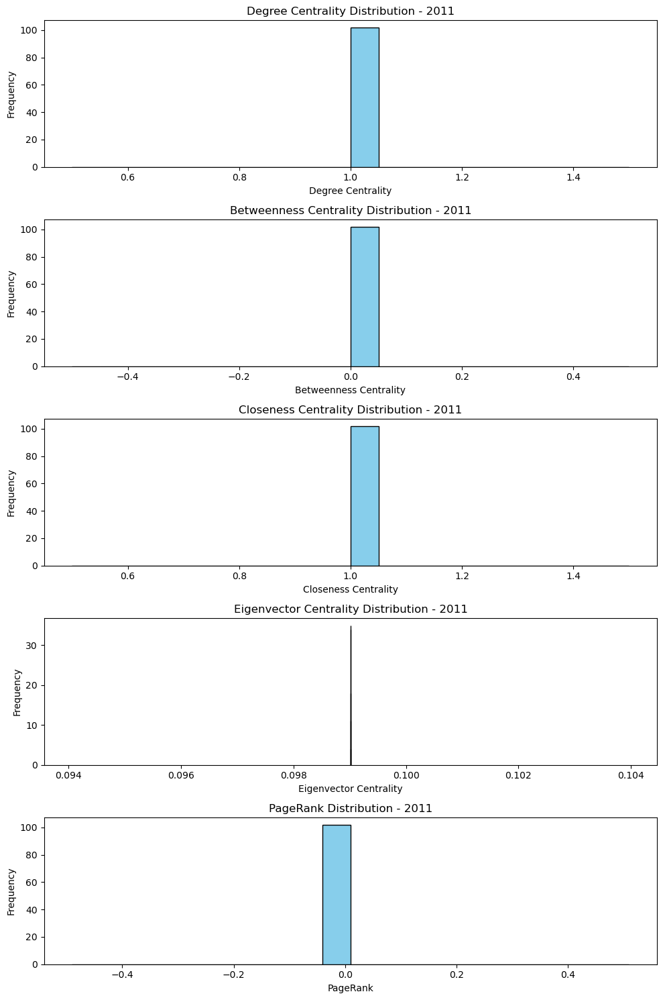

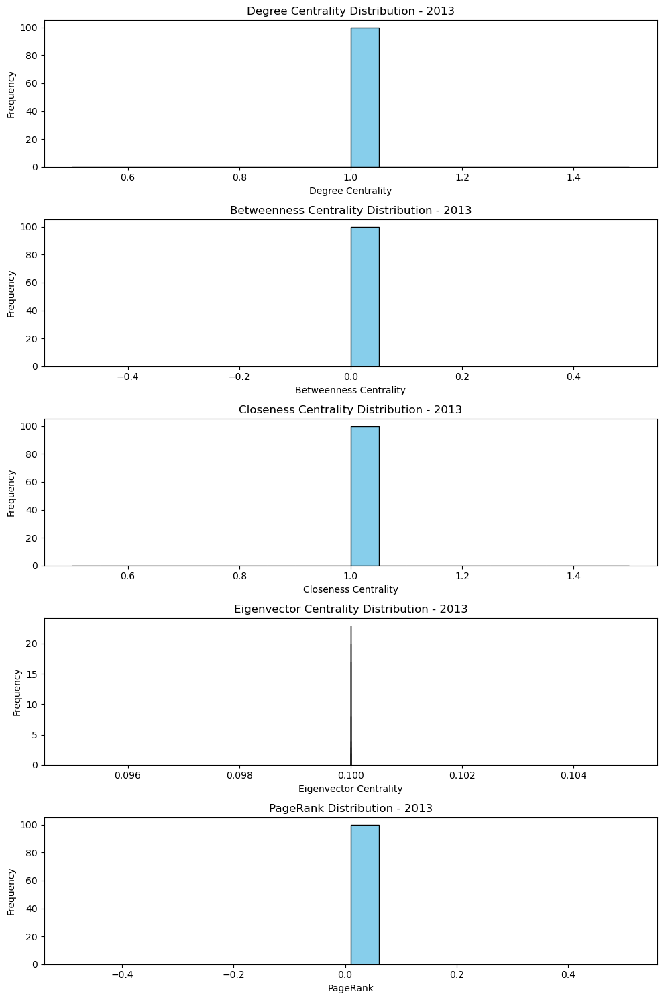

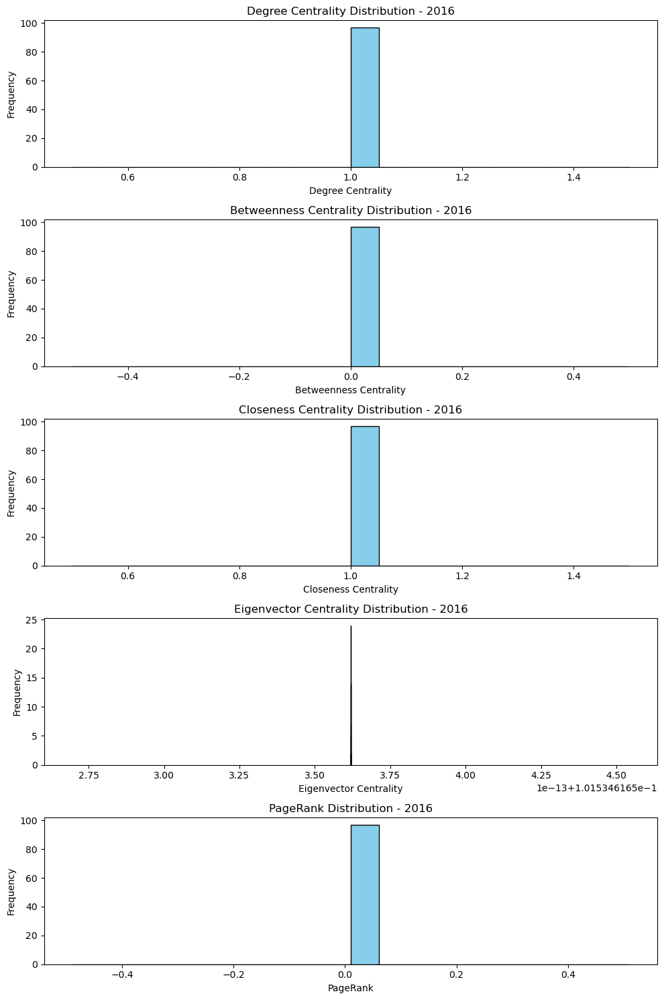

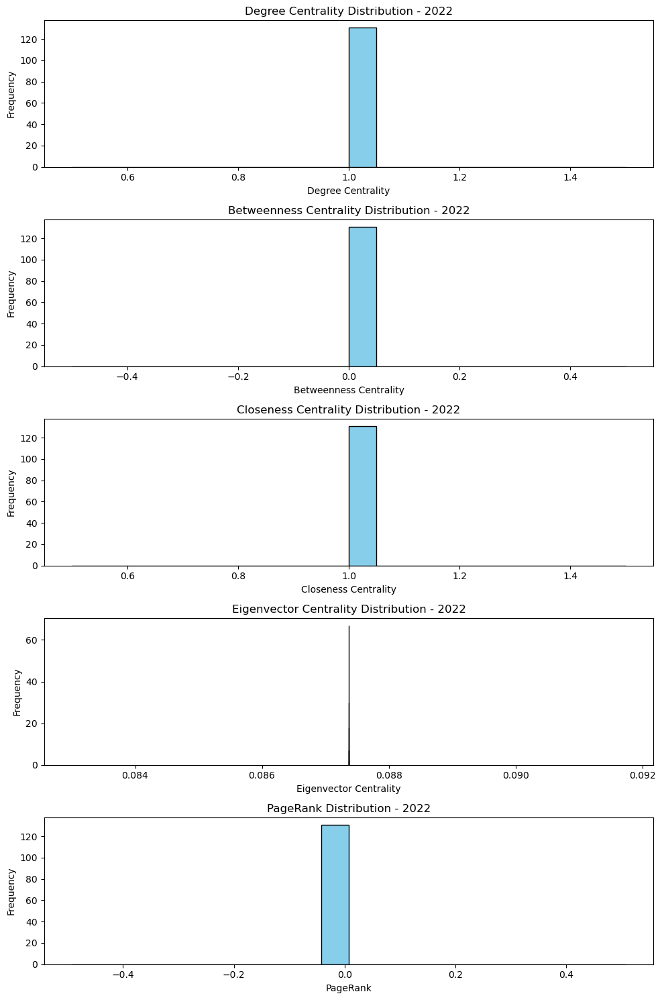

In [44]:
# Function to plot the distribution of centrality measures
def plot_centrality_distributions(metrics, metric_names, year):
    num_metrics = len(metric_names)
    fig, axs = plt.subplots(num_metrics, 1, figsize=(10, 15))
    
    for i, metric in enumerate(metric_names):
        values = list(metrics[metric].values())
        axs[i].hist(values, bins=20, color='skyblue', edgecolor='black')
        axs[i].set_title(f'{metric} Distribution - {year}')
        axs[i].set_xlabel(metric)
        axs[i].set_ylabel('Frequency')
    
    plt.tight_layout()
    plt.show()

# Centrality measures to be visualized
centrality_metric_names = ["Degree Centrality", "Betweenness Centrality", "Closeness Centrality", "Eigenvector Centrality", 'PageRank']

# Plotting centrality distributions for each year
plot_centrality_distributions(centralities_df['2011'], centrality_metric_names, "2011")
plot_centrality_distributions(centralities_df['2013'], centrality_metric_names, "2013")
plot_centrality_distributions(centralities_df['2016'], centrality_metric_names, "2016")
plot_centrality_distributions(centralities_df['2022'], centrality_metric_names, "2022")


    2011 Network:
    Degree Centrality: Uniform distribution with a peak at 1.0, indicating all nodes have the same number of connections.
    Betweenness Centrality: A single value at 0, suggesting no node acts as a bridge or bottleneck within the network.
    Closeness Centrality: Uniform distribution with a peak at 1.0, every node is equidistant to every other.
    Eigenvector Centrality: A single peak at 1.0, implying all nodes are equally central in terms of their connections to other central nodes.
    PageRank: A varied distribution, indicating differences in the web page ranking based on the network structure.

    2013 Network:
    Degree Centrality: Similar distribution as in 2011, with all nodes having the same connectivity.
    Betweenness Centrality: Continues to have a single value at 0, maintaining the non-existence of central bottleneck nodes.
    Closeness Centrality: The distribution remains peaked at 1.0, all nodes remain equidistant.
    Eigenvector Centrality: Identical to 2011, with all nodes equally central.
    PageRank: The distribution shows more variance than in 2011, indicating a change in the network's navigational dynamics.

    2016 Network:
    Degree Centrality: Consistent with previous years, showing uniform centrality for all nodes.
    Betweenness Centrality: No variation, all nodes have a betweenness centrality of 0.
    Closeness Centrality: Peak at 1.0 persists, all nodes are centrally located within the network.
    Eigenvector Centrality: Same as previous years, with a single value for all nodes.
    PageRank: Distribution broadens slightly compared to 2013, suggesting further evolution in the network's structure.

    2022 Network:
    Degree Centrality: Distribution continues to show a single peak at 1.0, no change in uniform connectivity.
    Betweenness Centrality: Still showing a value of 0 for all nodes, indicating the persistent absence of central connector nodes.
    Closeness Centrality: Maintains the peak at 1.0, with all nodes equally reachable.
    Eigenvector Centrality: Uniformity continues, all nodes have an equal influence on the network.
    PageRank: The most varied distribution among the centrality measures, indicating a diversification in the importance of nodes based on link structures.

The distributions of centrality measures from 2011 to 2022 demonstrate a remarkably stable network structure, with all nodes maintaining equal status in terms of degree, closeness, and eigenvector centralities. The consistently zero betweenness centrality across all years indicates a network where no single node is crucial for passing information, which is characteristic of a fully connected network. The variation in PageRank suggests some differences in the way nodes influence the traversal of the network. However, the overall stability in these distributions confirms the network's robustness and its "small-world" nature, with high density, maximum clustering, and minimal path lengths. The network structure does not exhibit a strong community division as indicated by the near-zero modularity, and the consistent strength of connections is evidenced by the relatively stable average edge weight.

### Step 4.2 Temporal Analysis of the sub-networks (per label)


In [45]:
# Creating sub-networks for all specified labels and 'other'
def create_sub_network(G, label, specific_labels):
    sub_graph = nx.Graph()
    for u, v, d in G.edges(data=True):
        edge_label = d['Label']
        # Check if the edge belongs to the specified label or to 'other'
        if label == 'other' and edge_label not in specific_labels:
            sub_graph.add_edge(u, v, **d)
        elif edge_label == label:
            sub_graph.add_edge(u, v, **d)
    return sub_graph

# Creating sub-networks for 2011 for all specified labels and 'other'
#specific_labels = {'person', 'country', 'product', 'gpe', 'org', 'norp', 'loc', 'city', 'dep'}
#sub_networks_2011 = {label: create_sub_network(graph_2011, label, specific_labels) for label in specific_labels}
#sub_networks_2011['other'] = create_sub_network(graph_2011, 'other', specific_labels)

# Calculating network metrics for a couple of labels and 'other' for 2011
#sub_network_metrics_2011 = {label: calculate_network_metrics(graph) for label, graph in sub_networks_2011.items() if label in ['person', 'country', 'other']}

# Displaying the metrics for 'person', 'country', and 'other' sub-networks
#sub_network_metrics_2011['person'], sub_network_metrics_2011['country'], sub_network_metrics_2011['other']

# Labels and years
labels = ['person', 'country', 'city', 'exchange', 'gpe', 'org', 'other']
years = {
    '2011': graph_2011,
    '2013': graph_2013,
    '2016': graph_2016,
    '2022': graph_2022
}

# Function to get metrics for all labels in a given year
#def get_year_metrics(year, graph, labels):
 #   metrics = {}
  #  for label in labels:
   #     sub_network = create_sub_network(graph, label, labels)
    #    metrics[label] = calculate_network_metrics(sub_network)
    #return metrics

# Calculating metrics for all labels and years
#all_metrics = {year: get_year_metrics(year, graph, labels) for year, graph in years.items()}

# Function to get metrics for all labels in a given year
def get_year_metrics(year, graph, labels):
    metrics = {}
    sub_networks = {}
    for label in labels:
        sub_network = create_sub_network(graph, label, labels)
        metrics[label] = calculate_network_metrics(sub_network)
        sub_networks[label] = sub_network
        nx.write_gexf(sub_network, f'{label}_{year}.gexf')  # Save Gephi files
    return metrics, sub_networks

# Calculate metrics and save sub-networks for all labels and years
all_metrics = {}
all_sub_networks = {}
for year, graph in graphs.items():
    year_metrics, year_sub_networks = get_year_metrics(year, graph, labels)
    all_metrics[year] = year_metrics
    all_sub_networks[year] = year_sub_networks

# Creating a DataFrame for visualization and analysis
all_metrics = pd.DataFrame(all_metrics)

# Save all calculate metrics
all_metrics.to_json('all_metrics.json')


C:\Users\Markus\anaconda3\envs\pytorch_env\lib\site-packages\networkx\algorithms\assortativity\correlation.py:298: RuntimeWarning: invalid value encountered in scalar divide
  return (xy * (M - ab)).sum() / np.sqrt(vara * varb)


C:\Users\Markus\AppData\Local\Temp\ipykernel_15036\3010923325.py:39: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  edge_color_map = plt.cm.get_cmap('Reds')


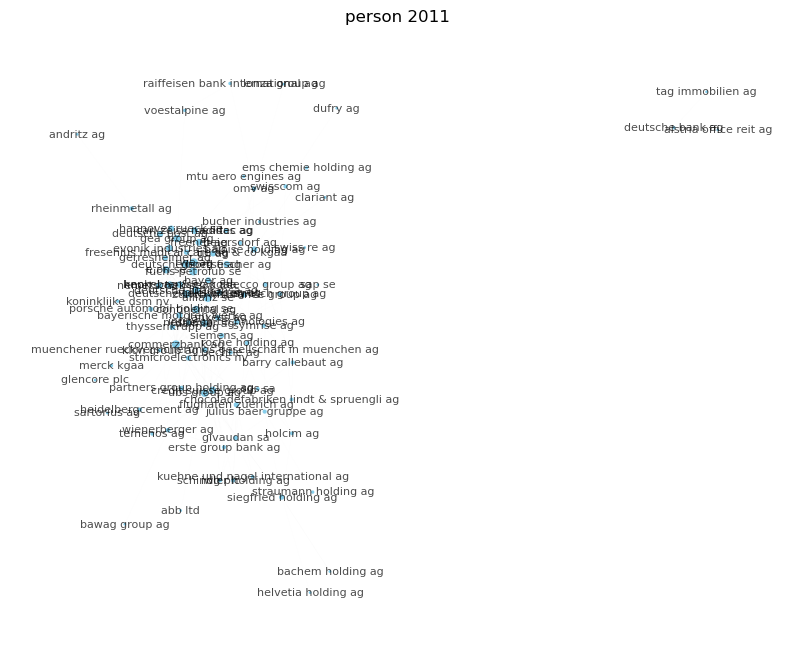

C:\Users\Markus\AppData\Local\Temp\ipykernel_15036\3010923325.py:52: DeprecationWarning: `alltrue` is deprecated as of NumPy 1.25.0, and will be removed in NumPy 2.0. Please use `all` instead.
  nx.draw_networkx_edges(G, pos, edgelist=edges_greater_than_10, width=widths_highlight, alpha=1,


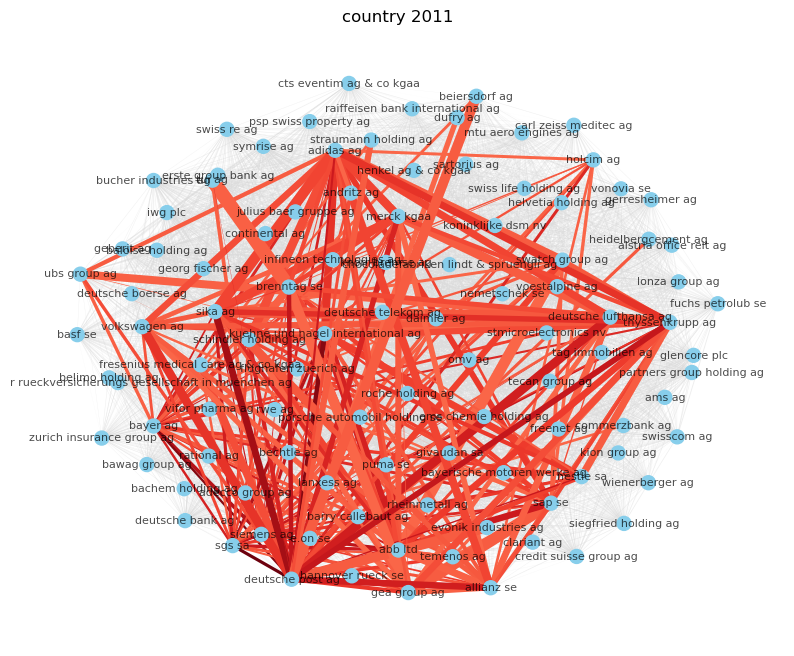

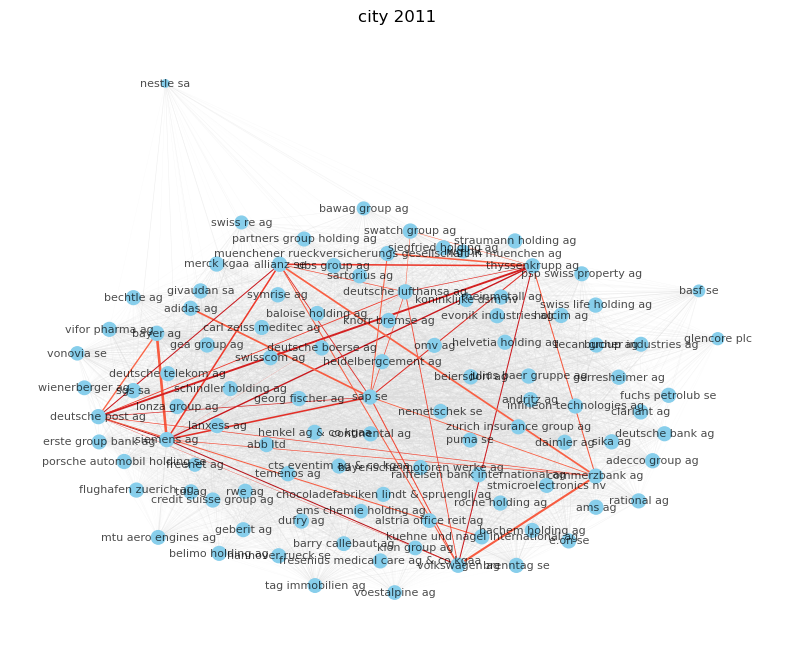

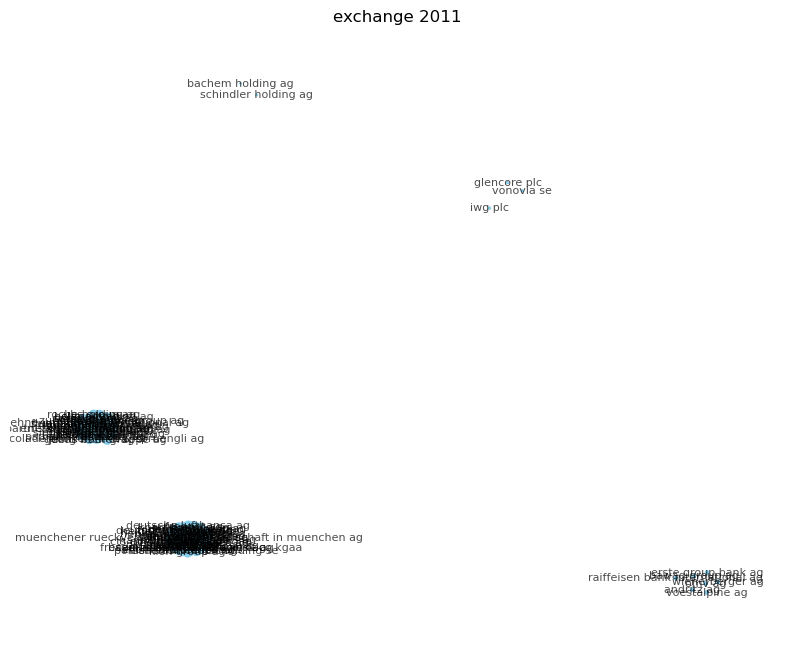

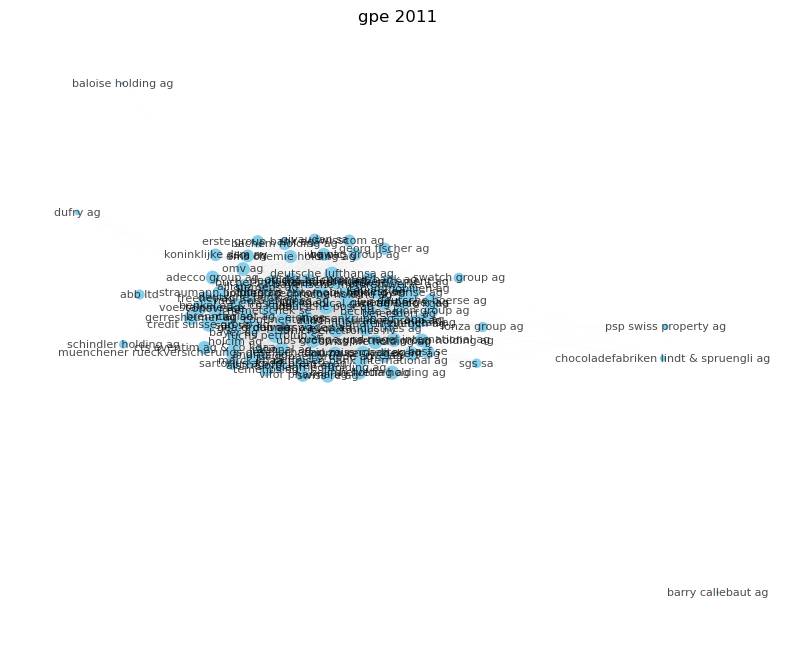

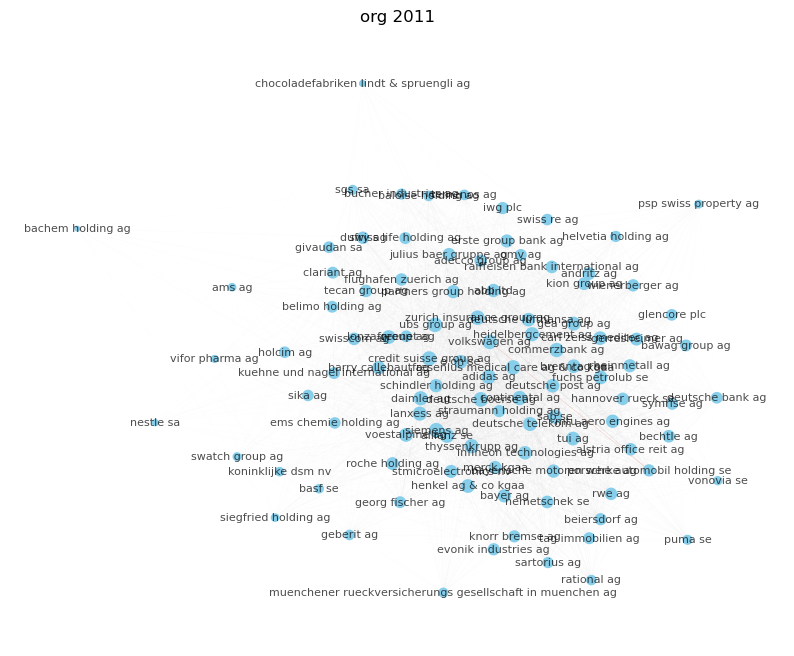

...

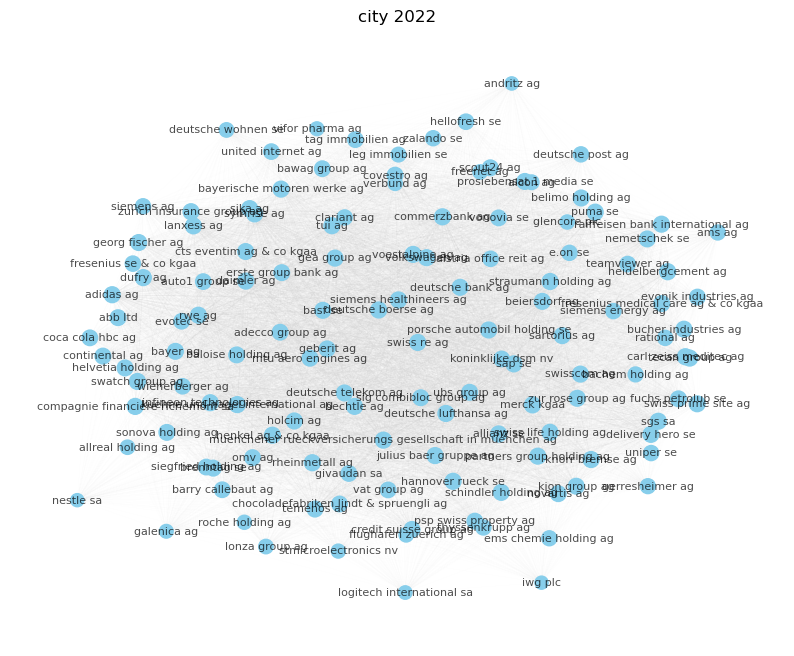

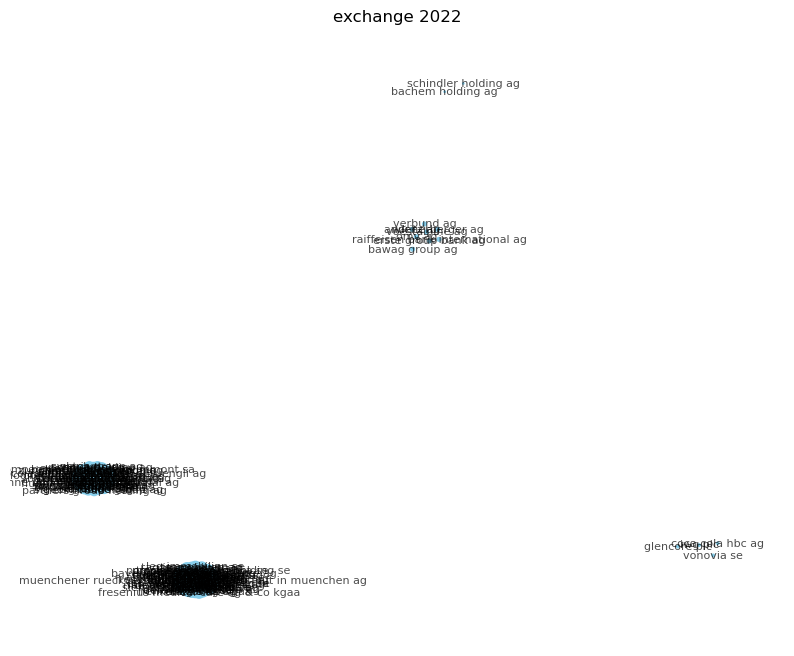

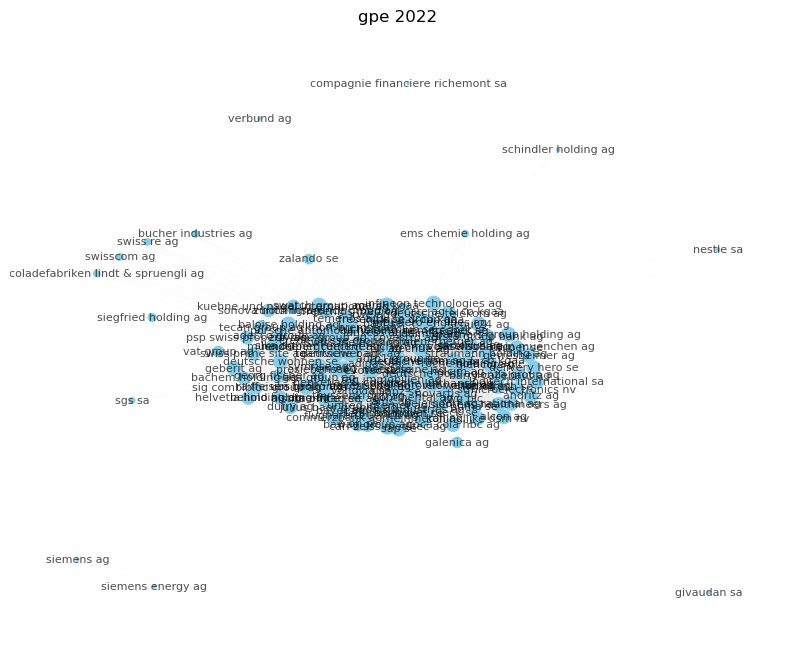

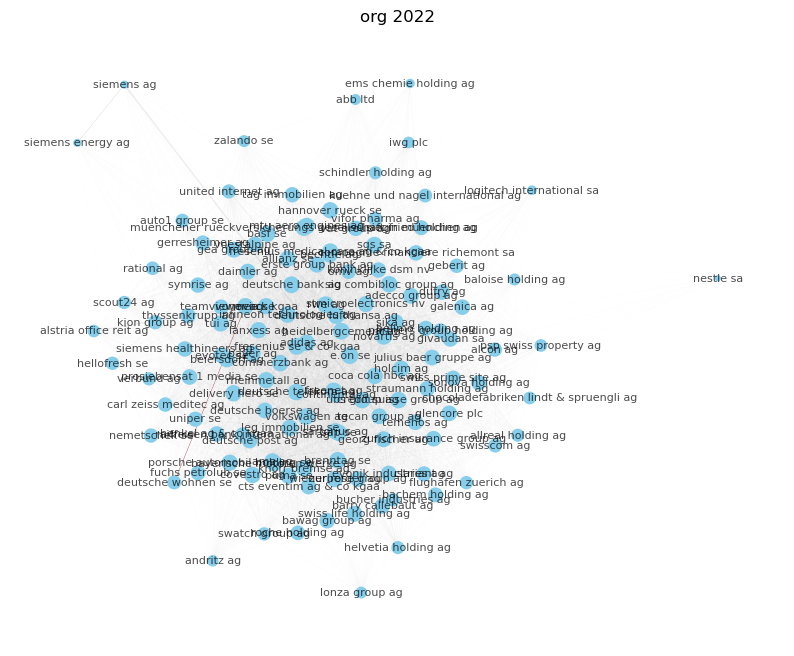

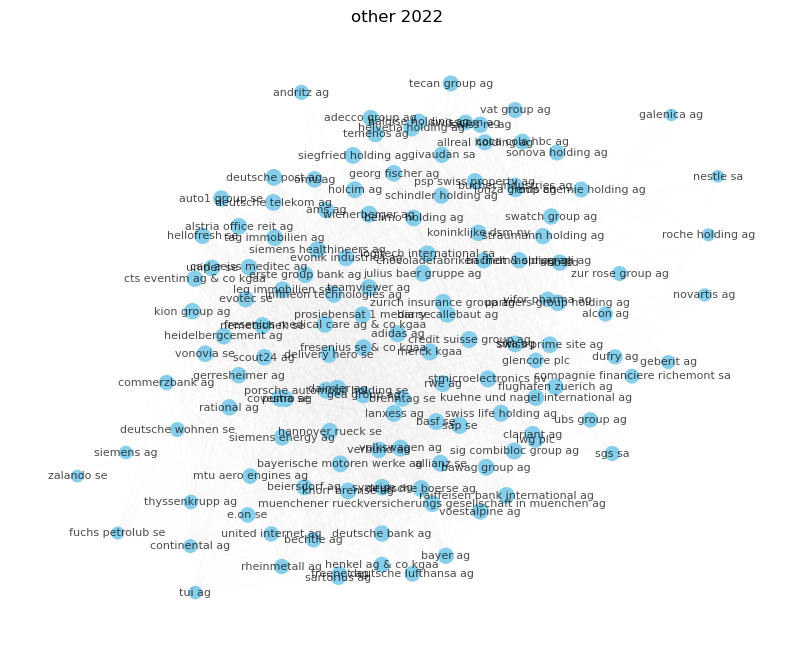

In [46]:
# Visualizing the sub-networks for 2011, 2013, 2016 and 2022 with weights and node sizes
for year, networks in all_sub_networks.items():
    for label, G in networks.items():
        visualize_graph_weighted(G, f"{label} {year}")


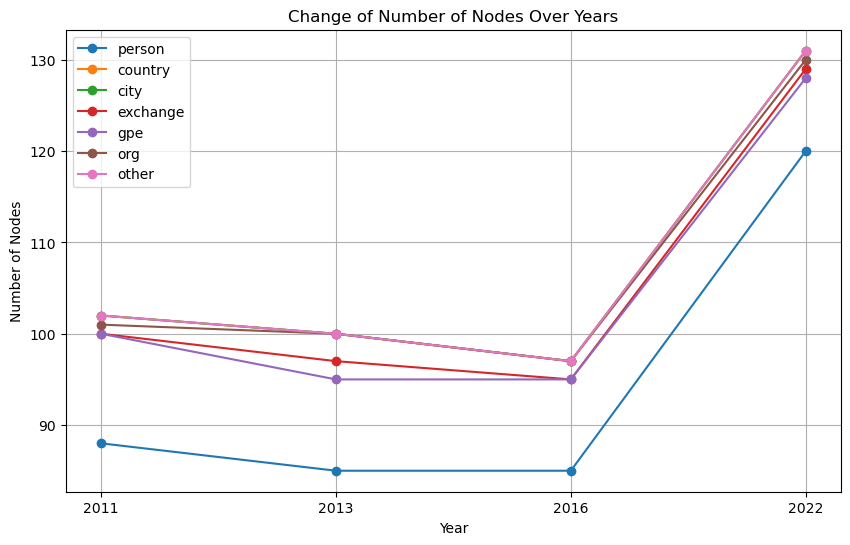

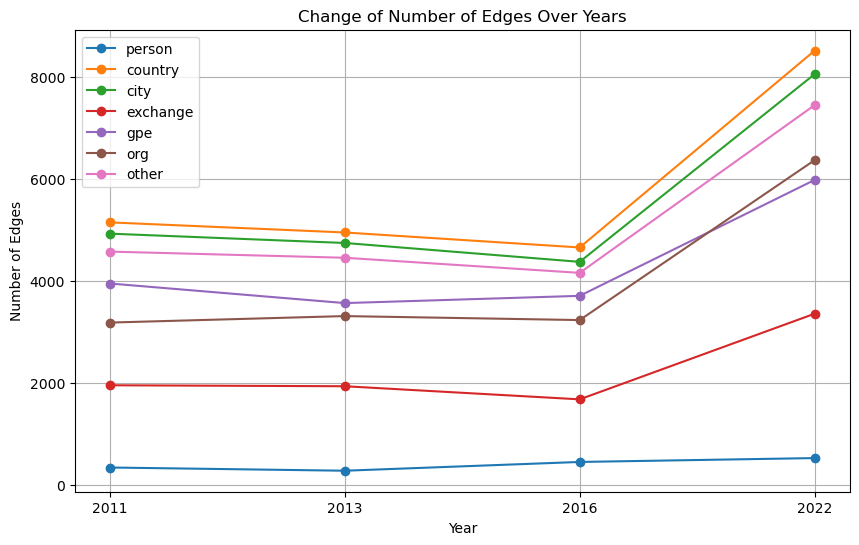

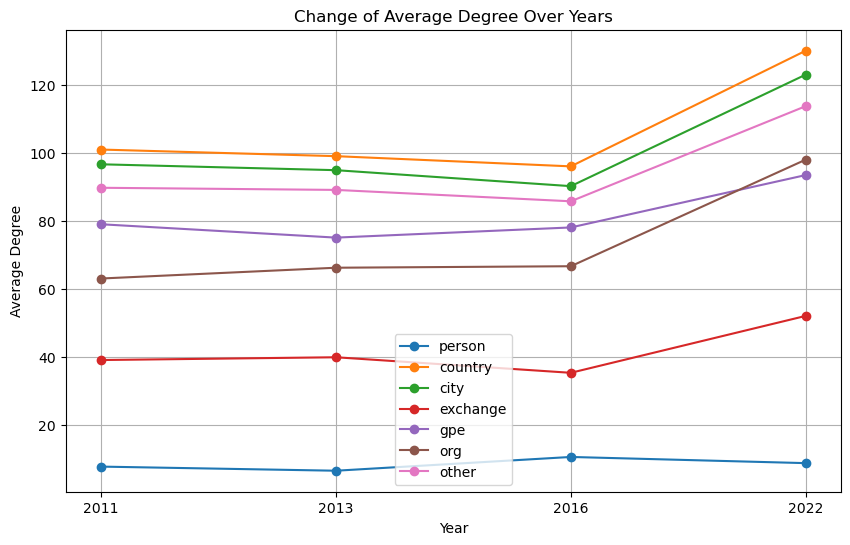

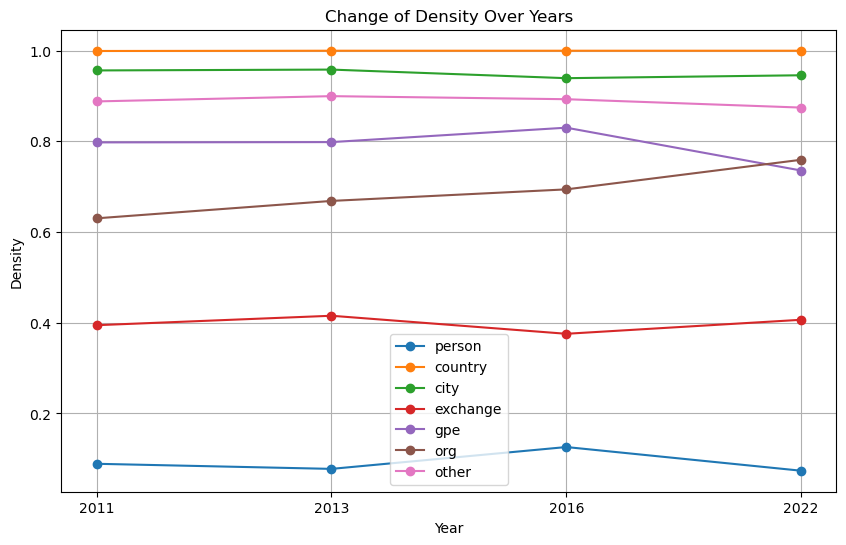

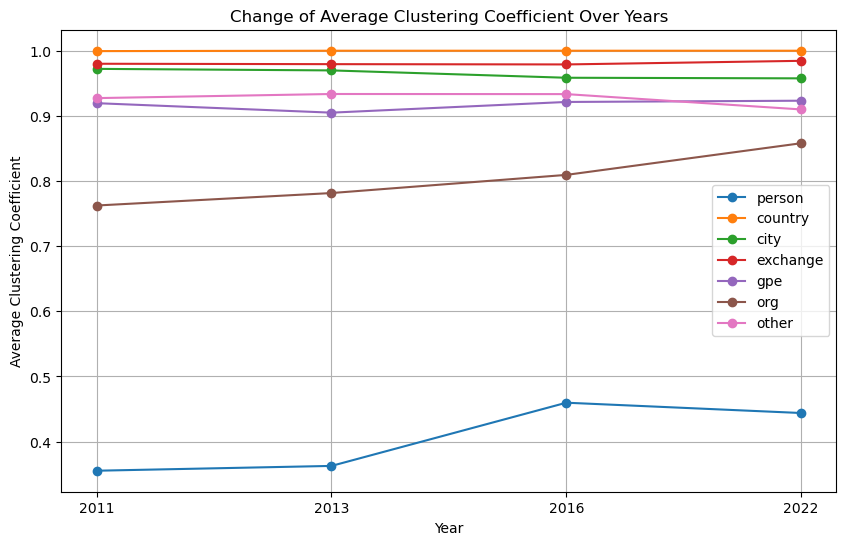

...

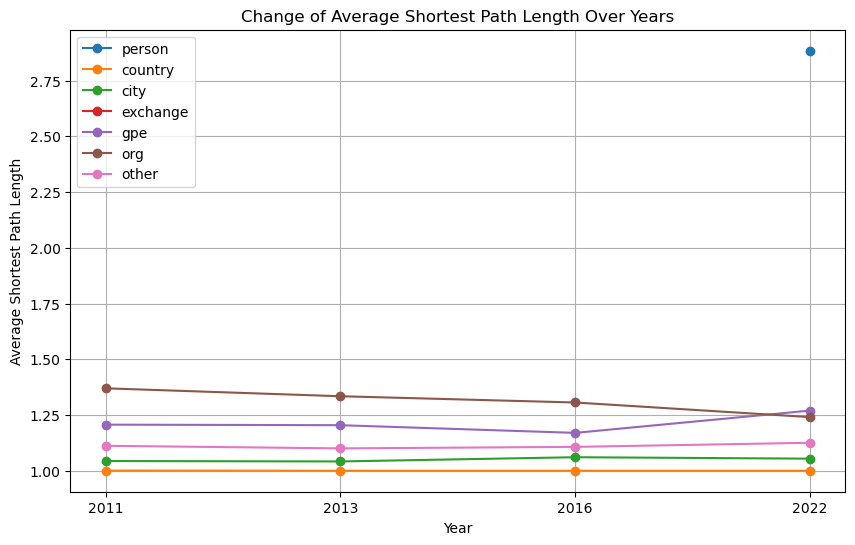

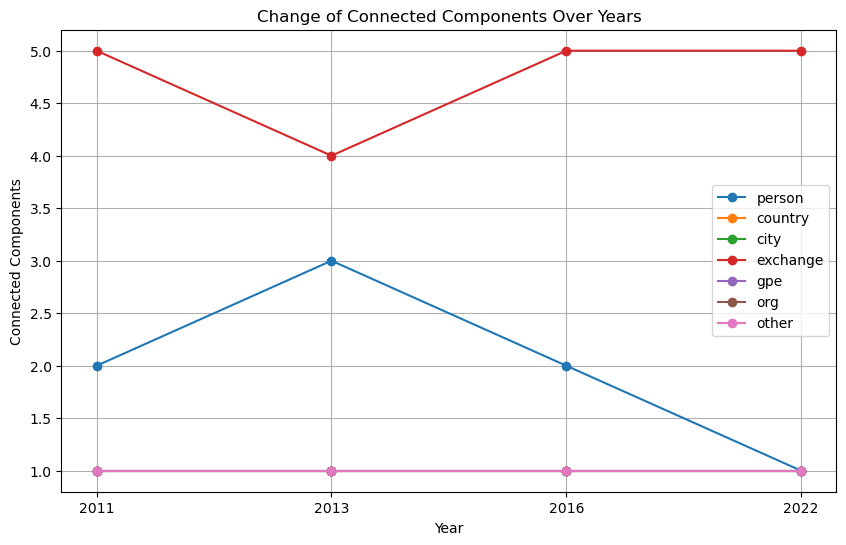

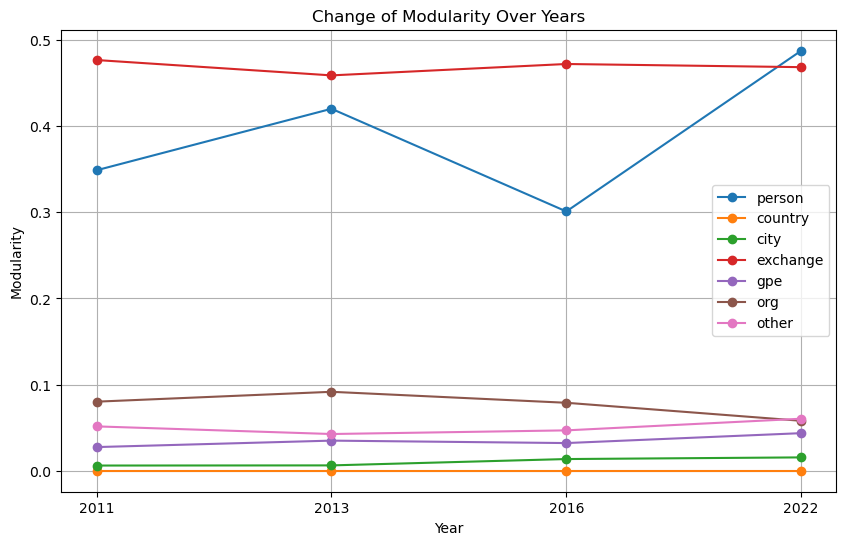

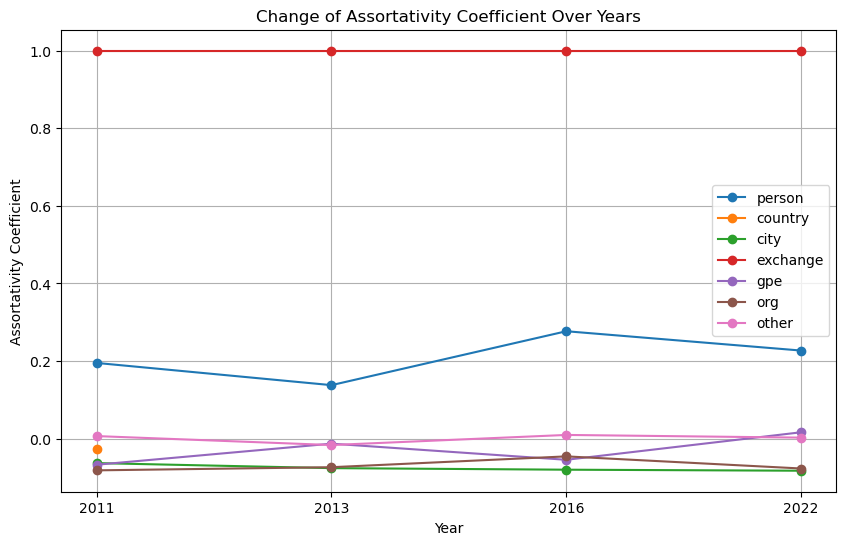

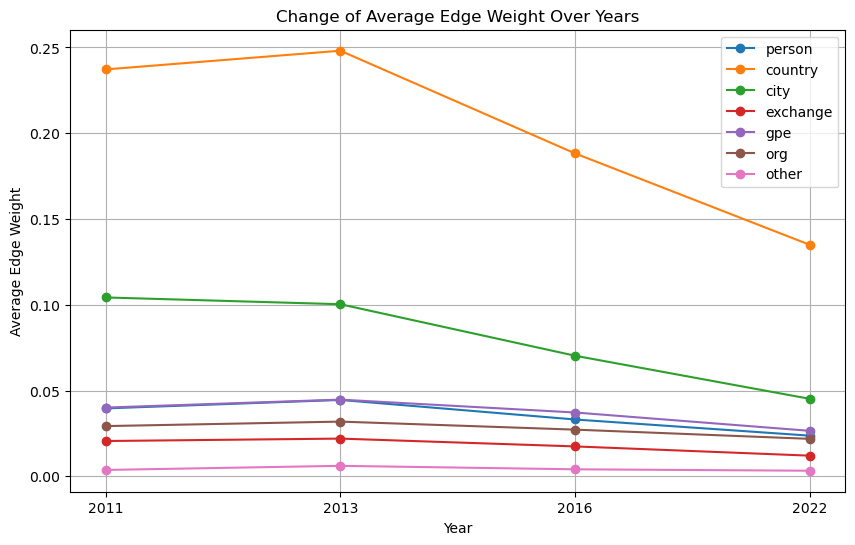

In [47]:
# Aggregating general network metrics for plotting
aggregated_general_metrics = {}
for year, data in all_metrics.items():
    for label, metrics in data.items():
        for metric in metric_names:
            value = metrics.get(metric, np.nan)  # Handle missing metrics
            aggregated_general_metrics.setdefault(metric, {}).setdefault(label, []).append(value)

# Plotting the general network metrics over all years for each label
for metric, label_data in aggregated_general_metrics.items():
    plt.figure(figsize=(10, 6))
    for label, values in label_data.items():
        plt.plot(years.keys(), values, label=label, marker='o')
    plt.title(f"Change of {metric} Over Years")
    plt.xlabel("Year")
    plt.ylabel(metric)
    plt.legend()
    plt.grid(True)
    plt.show()


    Number of Nodes:
        All labels show a sharp increase in the number of nodes in 2022, with 'city' and 'other' showing the most prominent rise, which suggests an expansion of the network with many new nodes being added.
    
    Number of Edges:
        There is a significant increase in the number of edges for all labels, especially after 2016, indicating a general trend of increasing interconnectivity within the network.   
    
    Average Degree:
        The 'person' category shows an increase in average degree over time, indicating that the nodes within this label are forming more connections.
        The 'country' label shows a consistent increase, suggesting a gradual increase in connectivity within this sub-network.

    Density:
        The 'person' label exhibits a noticeable decrease in density in 2016, followed by a rebound in 2022, which might reflect a temporary dispersal of nodes before becoming denser again.
        The 'gpe' category shows a significant drop in density, which could indicate a spread of nodes making the network less dense.
        
    Average Clustering Coefficient:
        The 'person' category starts with a lower average clustering coefficient in 2011 but increases to a high level by 2022, indicating a shift toward a more tightly-knit community.
        The 'city' and 'other' categories show a slight decrease, suggesting a slight loosening of the community structure.

    Diameter:
        The 'person' label shows a dramatic increase in network diameter in 2022, indicating the presence of longer paths between nodes, possibly due to network expansion or the addition of outlier nodes.
        The 'country', 'city', 'gpe', 'org', and 'other' categories remain relatively stable, suggesting that the maximum distances between nodes in these sub-networks have not significantly changed.

    Average Shortest Path Length:
        The 'person' category shows a significant increase in the average shortest path length in 2022, which could imply that the network has expanded or become more decentralized.
        Other labels remain fairly consistent in their average shortest path length, suggesting stable network structures.

    Connected Components:
        The 'exchange' category shows the most variation in the number of connected components, which suggests fragmentation or consolidation of its network at different times.
        The 'person' category moves from a fragmented state to a single connected component by 2022, indicating increasing interconnectivity or possibly a consolidation in the number of entities within this label.

    Modularity:
        The 'person' label exhibits a significant drop in modularity between 2011 and 2013, followed by an increase, suggesting that the community structure within this category has become less defined over time but may be consolidating again in recent years.
        The 'exchange' category shows a large fluctuation in modularity, indicating major changes in how its nodes are clustered into communities over the years.
    
    Assortativity Coefficient:
        The 'person' and 'exchange' labels show a high assortativity initially, which indicates a tendency of nodes to link to others that are similar in some way. However, by 2022, the 'person' label has seen a decrease in assortativity, while 'exchange' maintains a perfect score. This could imply that in the 'exchange' category, similar entities remain strongly connected over time.
        The other labels ('country', 'city', 'gpe', 'org', and 'other') show low assortativity throughout, suggesting a more heterogeneous network where different types of nodes are more likely to be connected.

    Average Edge Weight:
        The verall, the trend in the average edge weight points to a dynamic change in the network's relationships over time. The significant decrease in edge weight for 'exchange' could reflect a broadening network where exchanges are more frequent but less intense.
        In contrast, stability or slight increases in other categories like 'gpe' and 'org' suggest that relationships within these categories are either maintaining their strength or becoming slightly stronger

From these observations, it can be concluded that the network has become more complex and interconnected over time.


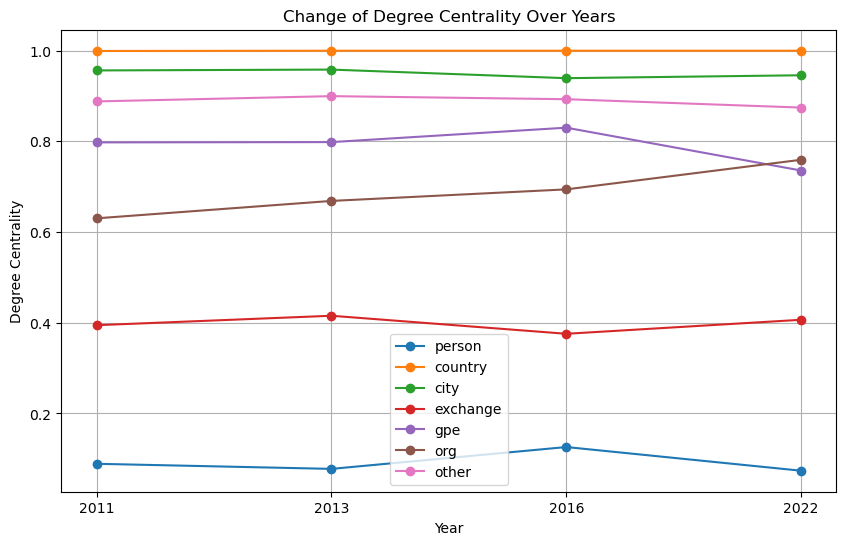

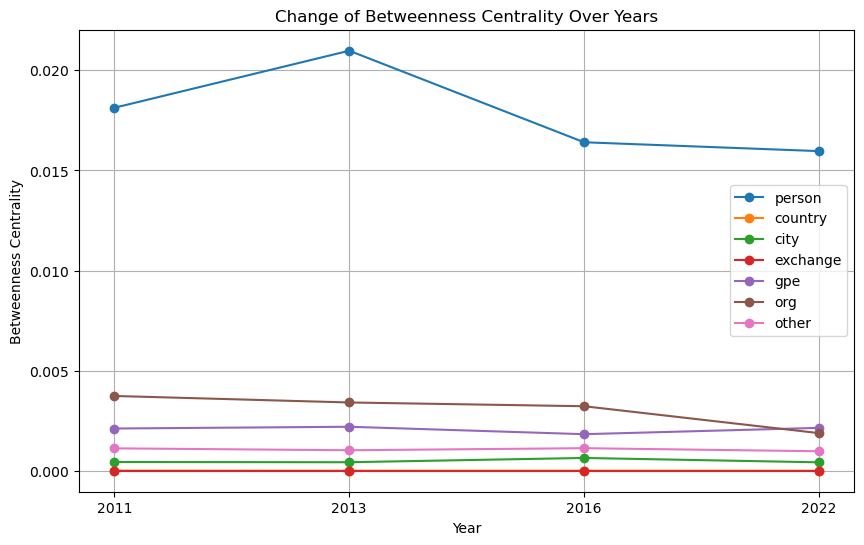

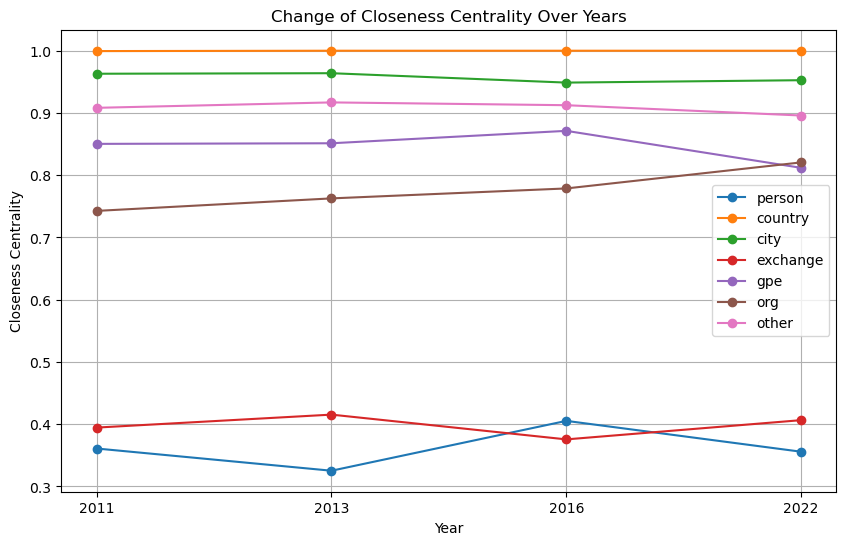

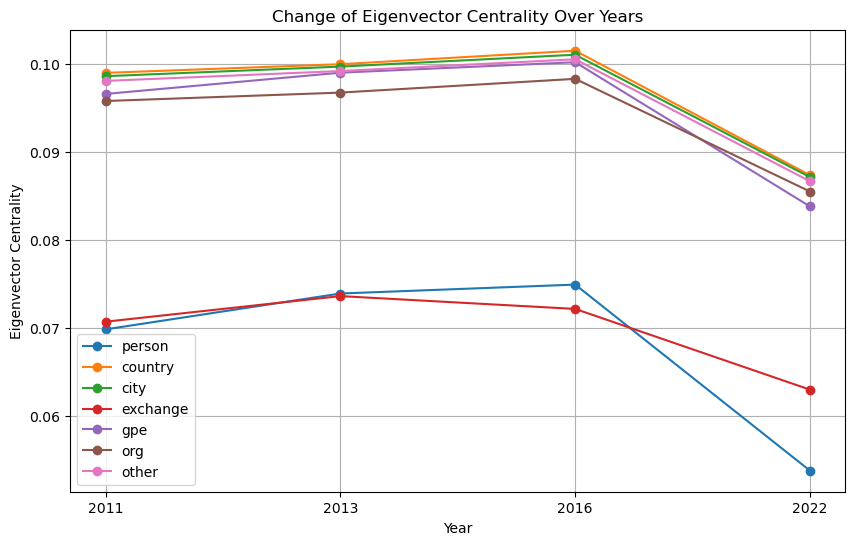

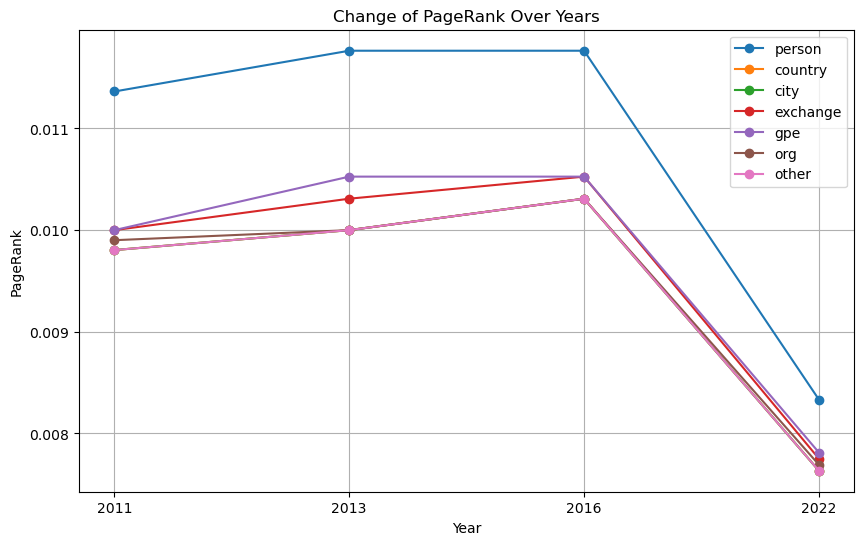

In [48]:
# Aggregating centrality measures for plotting
aggregated_centrality_metrics = {}
for year, data in all_metrics.items():
    for label, metrics in data.items():
        for metric in centrality_metric_names:
            centrality_values = metrics.get(metric, {})
            # Example aggregation: average centrality score
            average_centrality = np.mean(list(centrality_values.values())) if centrality_values else np.nan
            aggregated_centrality_metrics.setdefault(metric, {}).setdefault(label, []).append(average_centrality)

# Plotting the centrality measures over all years for each label
for metric, label_data in aggregated_centrality_metrics.items():
    plt.figure(figsize=(10, 6))
    for label, values in label_data.items():
        plt.plot(years.keys(), values, label=label, marker='o')
    plt.title(f"Change of {metric} Over Years")
    plt.xlabel("Year")
    plt.ylabel(metric)
    plt.legend()
    plt.grid(True)
    plt.show()


    Degree Centrality:
        'Country' maintains a constant and perfect degree centrality score of 1.0 throughout the years, indicating it has maximum connectivity.
        'City' shows high but slightly fluctuating connectivity, with a minor decrease towards 2022.
        'Person' and 'Exchange' have lower connectivity, with 'Person' showing some increase around 2016 and then stabilizing.
        'Gpe', 'Org', and 'Other' demonstrate varied patterns, with 'Org' showing an increasing trend, suggesting growing connectivity.

    Betweenness Centrality:
        'Person' starts with the highest betweenness centrality, indicating significant control over information flow, but this decreases over time.
        All other labels have very low betweenness centrality, with 'Country' almost at zero, indicating these are not critical in connecting different parts of the network.
        'City' and 'Org' show minor fluctuations, but remain relatively insignificant as intermediaries.

    Closeness Centrality:
        'Country' has the highest closeness centrality, maintaining perfect scores, indicating shortest paths to all other nodes. This score slightly decreases by 2022.
        'City' shows high closeness centrality, but also decreases slightly, suggesting it is becoming marginally less central.
        'Person' exhibits the lowest closeness centrality, with some fluctuation but a general increase towards 2022, possibly becoming more central over time.
        'Gpe', 'Org', and 'Other' show slight decreases, implying a small increase in their average distance to other nodes.

    Eigenvector Centrality:
        'Person' has a significant decrease in eigenvector centrality after 2016, suggesting a loss in influence within the network.
        'Country', 'City', and 'Other' show a decrease after 2016, indicating that the nodes they are connected to are also losing influence or connectivity.
        'Gpe' and 'Org' follow a similar trend, but 'Org' has a less steep decline.

    PageRank:
        'Person' experiences a sharp decline in PageRank after 2016, suggesting a significant loss in the overall importance within the network.
        'Country' and 'City' also see a reduction, with a more pronounced decline by 2022.
        'Exchange', 'Gpe', 'Org', and 'Other' show relatively stable PageRanks until a drop around 2022, indicating a change in their network status.

Overall, the network dynamics change significantly over the years, with 'Country' remaining highly central and connected but losing some influence and importance by 2022. 'City' retains centrality but also loses some influence. 'Person' and 'Org' show increasing network presence in terms of connectivity, but 'Person' loses influence and importance, suggesting a change in the network structure where the roles of various labels shift.